In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nengo
import scipy
import pandas as pd
palette = sns.color_palette('tab10')
sns.set_palette(palette)
sns.set(context='paper', style='white', font="cmr10", font_scale=1.2)
plt.rcParams['axes.formatter.use_mathtext'] = True

# Differentiate and integrate

In [24]:
stimuli = np.random.RandomState(seed=0).randint(0,2,size=21)
stimuli = 2*stimuli - 1
func_stim = lambda t: stimuli[int(t)] if t%1<0.5 else 0
syn_fb = 0.2
radius = 2

network = nengo.Network(seed=0)
with network:
    node_stim = nengo.Node(func_stim)
    
    ens_stim = nengo.Ensemble(1000, 1)
    ens_delta = nengo.Ensemble(1000, 1, encoders=nengo.dists.Choice([[1]]), intercepts=nengo.dists.Uniform(0,1))
    ens_memory = nengo.Ensemble(2000, 1, radius=radius)    
    conn_stim = nengo.Connection(node_stim, ens_stim)
    conn_delta1 = nengo.Connection(ens_stim, ens_delta, synapse=0.01, function=lambda x: 2*np.abs(x))
    conn_delta2 = nengo.Connection(ens_stim, ens_delta, synapse=0.1, function=lambda x: -2*np.abs(x))
    conn_memff = nengo.Connection(ens_delta, ens_memory, synapse=syn_fb, transform=syn_fb)
    conn_memfb = nengo.Connection(ens_memory, ens_memory, synapse=syn_fb)
    
    probe_stim = nengo.Probe(ens_stim, synapse=0.01)
    probe_delta = nengo.Probe(ens_delta, synapse=0.01)
    probe_memory = nengo.Probe(ens_memory, synapse=0.01)
sim = nengo.Simulator(network, dt=0.001)
with sim:
    sim.run(10)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

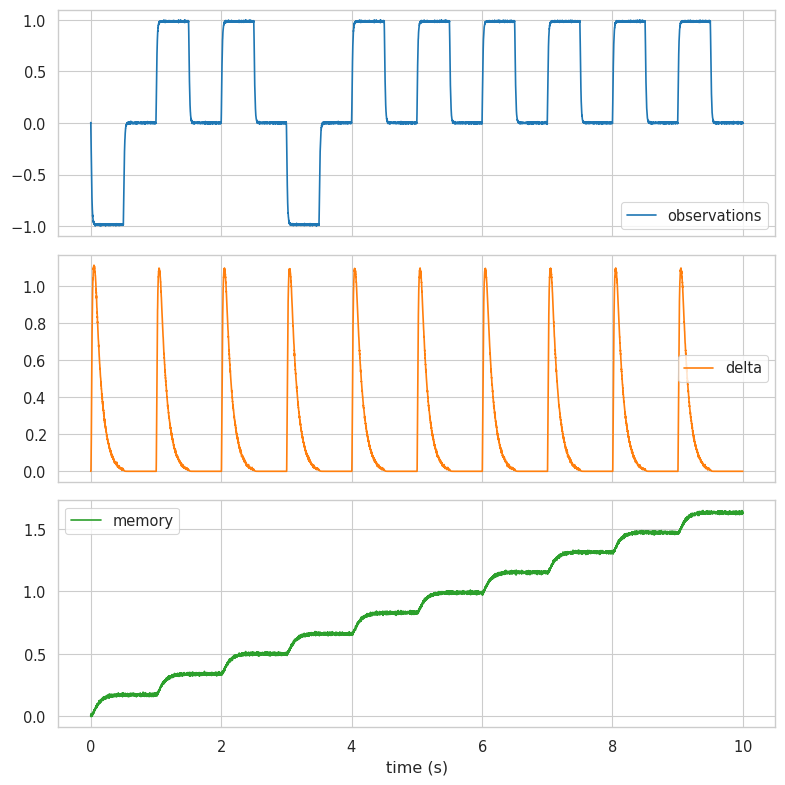

In [25]:
with sns.axes_style("whitegrid"):  # This enables gridlines
    fig, axes = plt.subplots(nrows=3, sharex=True, figsize=(8,8))
    sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_stim].flatten(), label='observations', color=palette[0], ax=axes[0])
    sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_delta].flatten(), label='delta', color=palette[1], ax=axes[1])
    sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_memory].flatten(), label='memory', color=palette[2], ax=axes[2])
    axes[2].set(xlabel='time (s)')
    plt.grid(True, axis='y')  # Enable only y-axis gridlines
    fig.tight_layout()

# Learn mapping from N to 1/N

In [65]:
stimuli = np.random.RandomState(seed=0).randint(1,6,size=10000)
func_stim = lambda t: stimuli[int(t*10)]
func_weight = lambda x: 1/(x+3) if x!=-3 else 1
func_stop = lambda t: 1 if t>T/2 else 0
syn_fb = 0.2
radius = 6
a = 1e-4
T = 100

network = nengo.Network(seed=0)
with network:
    node_stim = nengo.Node(func_stim)
    node_target = nengo.Ensemble(1, 1, neuron_type=nengo.Direct())
    node_stop = nengo.Node(func_stop)
    
    ens_memory = nengo.Ensemble(2000, 1, radius=radius)
    ens_weight = nengo.Ensemble(2000, 1)
    ens_error = nengo.Ensemble(2000, 1)
    conn_stim = nengo.Connection(node_stim, ens_memory)
    conn_weight = nengo.Connection(ens_memory, ens_weight, synapse=0.01,
                                   function=lambda x: 0, learning_rule_type=nengo.PES(learning_rate=a))

    conn_perfect = nengo.Connection(node_stim, node_target, function=func_weight)
    conn_error1 = nengo.Connection(node_target, ens_error, transform=1)
    conn_error2 = nengo.Connection(ens_weight, ens_error, transform=-1)
    conn_learning = nengo.Connection(ens_error, conn_weight.learning_rule, transform=-1)
    conn_stop = nengo.Connection(node_stop, ens_error.neurons, transform=-1000*np.ones((ens_error.n_neurons, 1)))
    
    probe_stim = nengo.Probe(node_stim, synapse=0.01)
    probe_target = nengo.Probe(node_target, synapse=0.01)
    probe_memory = nengo.Probe(ens_memory, synapse=0.01)
    probe_weight = nengo.Probe(ens_weight, synapse=0.01)
    probe_error = nengo.Probe(ens_error, synapse=0.01)
    probe_learned_weights = nengo.Probe(conn_weight, "weights")

sim = nengo.Simulator(network, dt=0.001)
with sim:
    sim.run(T)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

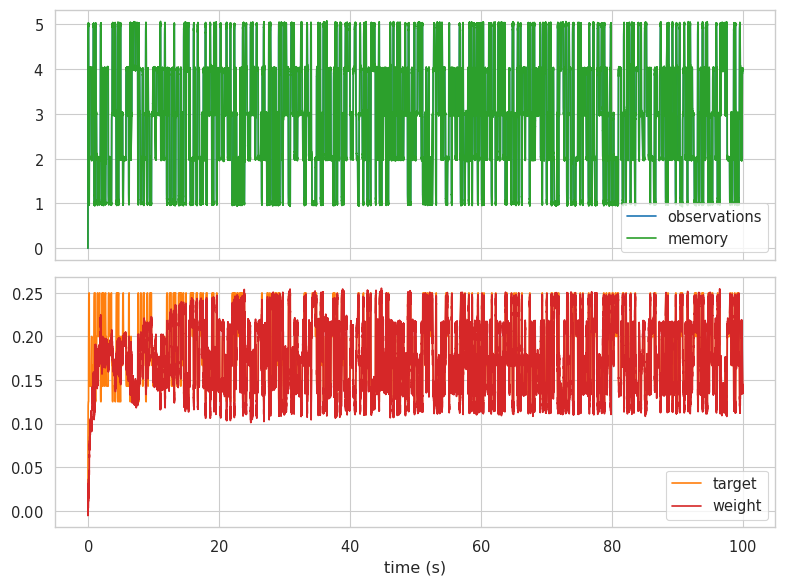

In [64]:
with sns.axes_style("whitegrid"):  # This enables gridlines
    fig, axes = plt.subplots(nrows=2, sharex=True, figsize=(8,6))
    sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_stim].flatten(), label='observations', color=palette[0], ax=axes[0])
    sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_target].flatten(), label='target', color=palette[1], ax=axes[1])
    sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_memory].flatten(), label='memory', color=palette[2], ax=axes[0])
    sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_weight].flatten(), label='weight', color=palette[3], ax=axes[1])
    axes[1].set(xlabel='time (s)')
    plt.grid(True, axis='y')  # Enable only y-axis gridlines
    fig.tight_layout()

In [66]:
learned_weights = sim.data[probe_learned_weights][-1]

In [70]:
learned_weights.shape

(1, 2000)

In [73]:
np.where(learned_weights==0)[1].shape

(605,)

# Use PES to learn f(x) = 1/N

In [30]:
class Environment():
    def __init__(self, dataset, sid, trial, T=1, dt=0.001, dim_context=5, seed_env=0):
        self.T = T
        self.dt = dt
        self.sid = sid
        self.trial = trial
        self.dataset = dataset
        self.empirical = pd.read_pickle(f"data/{dataset}.pkl").query("sid==@sid & trial==@trial")
        self.dim_context = dim_context
        self.rng = np.random.RandomState(seed=seed_env)
        self.context = self.rng.rand(self.dim_context)
        self.context = self.context / np.linalg.norm(self.context)
        if self.dataset=='carrabin':
            self.Tall = 5*self.T - self.dt
            self.stages = range(1, 6)
        # create input arrays
        self.colors = []
        self.weights = []
        tt = int(self.T / self.dt / 2)
        if self.dataset=='carrabin':
            for stage in self.stages:
                color = self.empirical.query("stage==@stage")['color'].unique()[0]
                self.colors.extend(color * np.ones((tt, 1)))
                self.colors.extend(0.000 * np.ones((tt, 1)))
        self.colors = np.array(self.colors).flatten()
    def sample(self, t):
        tidx = int(t/self.dt)
        return [self.colors[tidx]]

In [3]:
def pretrain(learned_weights, env, n_neurons=1000, seed_net=0, syn_fb=0.2, radius=2, a=1e-4, train=False):
    func_stim = lambda t: env.sample(t)
    func_weight = lambda t: 1/(int(t)+3) if t!=-3 else 1
    func_stop = lambda t: 1 - np.abs(env.sample(t))
    
    network = nengo.Network(seed=seed_net)
    with network:
        node_stim = nengo.Node(func_stim)
        node_target = nengo.Node(func_weight)
        node_stop = nengo.Node(func_stop)
        
        ens_stim = nengo.Ensemble(n_neurons, 1, seed=seed_net)
        ens_delta = nengo.Ensemble(n_neurons, 1, encoders=nengo.dists.Choice([[1]]), intercepts=nengo.dists.Uniform(0,1), seed=seed_net)
        ens_memory = nengo.Ensemble(n_neurons, 1, radius=radius, seed=seed_net)    
        ens_weight = nengo.Ensemble(n_neurons, 1, seed=seed_net)
        ens_error = nengo.Ensemble(n_neurons, 1, seed=seed_net)

        conn_stim = nengo.Connection(node_stim, ens_stim, seed=seed_net)
        conn_delta1 = nengo.Connection(ens_stim, ens_delta, synapse=0.01, function=lambda x: 2*np.abs(x), seed=seed_net)
        conn_delta2 = nengo.Connection(ens_stim, ens_delta, synapse=0.1, function=lambda x: -2*np.abs(x), seed=seed_net)
        conn_memff = nengo.Connection(ens_delta, ens_memory, synapse=syn_fb, transform=syn_fb, seed=seed_net)
        conn_memfb = nengo.Connection(ens_memory, ens_memory, synapse=syn_fb, seed=seed_net)
        if train:
            conn_weight = nengo.Connection(ens_memory.neurons, ens_weight,
                                           transform=learned_weights, learning_rule_type=nengo.PES(learning_rate=a), seed=seed_net)
            conn_error1 = nengo.Connection(node_target, ens_error, transform=1, seed=seed_net)
            conn_error2 = nengo.Connection(ens_weight, ens_error, transform=-1, seed=seed_net)
            conn_learning = nengo.Connection(ens_error, conn_weight.learning_rule, transform=-1, seed=seed_net)
            conn_stop = nengo.Connection(node_stop, ens_error.neurons, transform=-1000*np.ones((n_neurons, 1)), seed=seed_net)
        else:
            conn_weight = nengo.Connection(ens_memory.neurons, ens_weight, transform=learned_weights, seed=seed_net)                     

        probe_stim = nengo.Probe(ens_stim, synapse=0.01)
        probe_target = nengo.Probe(node_target, synapse=0.01)
        probe_delta = nengo.Probe(ens_delta, synapse=0.01)
        probe_memory = nengo.Probe(ens_memory, synapse=0.01)
        probe_weight = nengo.Probe(ens_weight, synapse=0.01)
        if train:
            probe_error = nengo.Probe(ens_error, synapse=0.01)
            probe_learned_weights = nengo.Probe(conn_weight, "weights")

    sim = nengo.Simulator(network, dt=0.001, progress_bar=False)
    with sim:
        sim.run(5-0.001)

    if train:
        learned_weights = sim.data[probe_learned_weights][-1]

    with sns.axes_style("whitegrid"):  # This enables gridlines
        fig, axes = plt.subplots(nrows=2, sharex=True, figsize=(8,6))
        # sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_stim].flatten(), label='observations', color=palette[0], ax=axes[0])
        sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_memory].flatten(), label='memory', color=palette[0], ax=axes[0])
        if train:
            sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_error].flatten(), label='error', color=palette[1], ax=axes[0])
        sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_target].flatten(), label='target', color=palette[2], ax=axes[1])
        sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_weight].flatten(), label='weight', color=palette[3], ax=axes[1])
        # axes[0].set(title=f"training iteration {seed_stim}")
        axes[1].set(xlabel='time (s)')
        plt.grid(True, axis='y')  # Enable only y-axis gridlines
        fig.tight_layout()

    if train:
        return learned_weights
    else:
        return network, sim

training iteration 1
training iteration 2
training iteration 3
training iteration 4
training iteration 5
training iteration 6
training iteration 7
training iteration 8
training iteration 9
training iteration 10
training iteration 11
training iteration 12
training iteration 13
training iteration 14
training iteration 15
training iteration 16
training iteration 17
training iteration 18
training iteration 19
training iteration 20
training iteration 21


/tmp/ipykernel_360461/859703211.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(nrows=2, sharex=True, figsize=(8,6))


training iteration 22
training iteration 23
training iteration 24
training iteration 25
training iteration 26
training iteration 27
training iteration 28
training iteration 29
training iteration 30
training iteration 31
training iteration 32
training iteration 33
training iteration 34
training iteration 35
training iteration 36
training iteration 37
training iteration 38
training iteration 39
training iteration 40


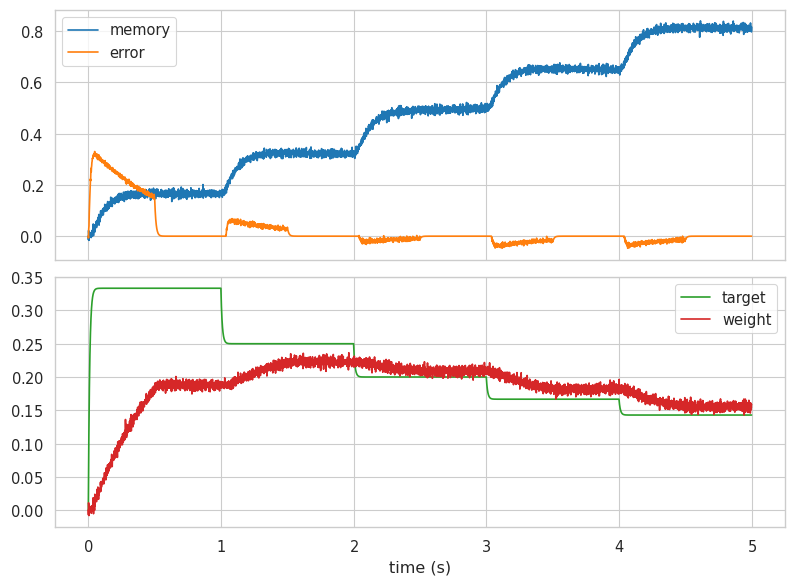

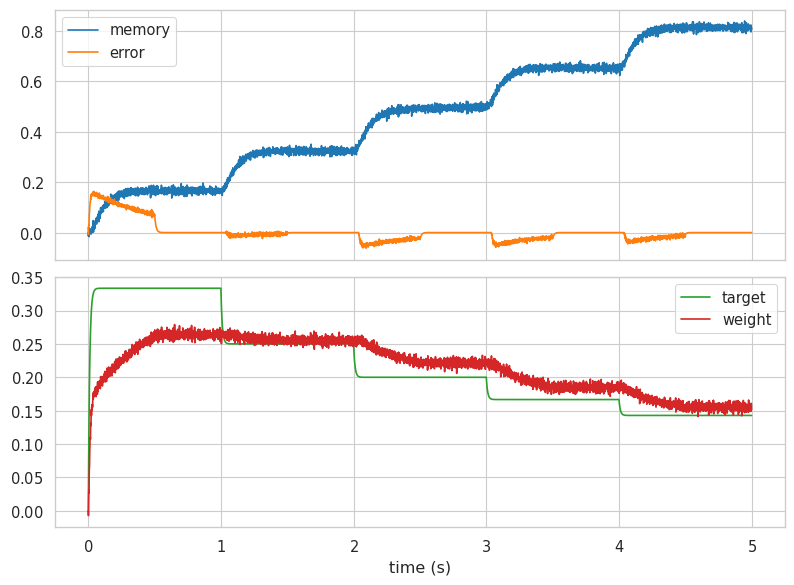

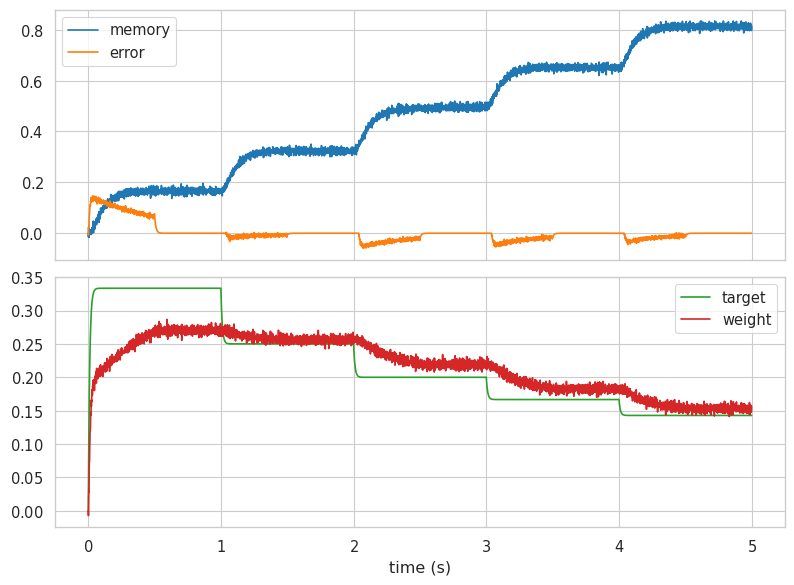

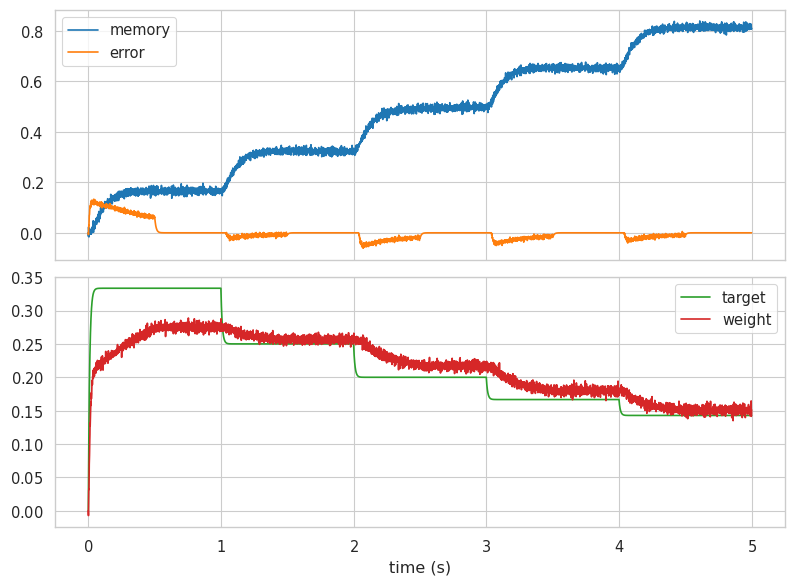

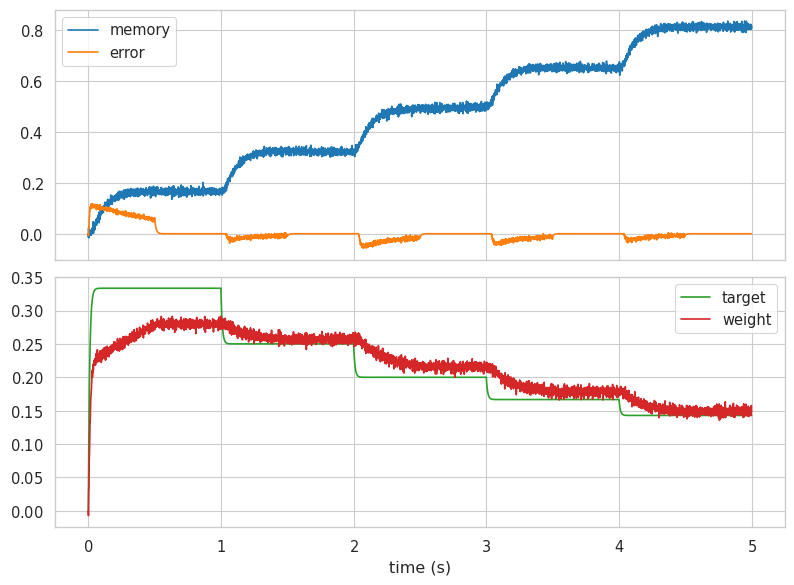

...

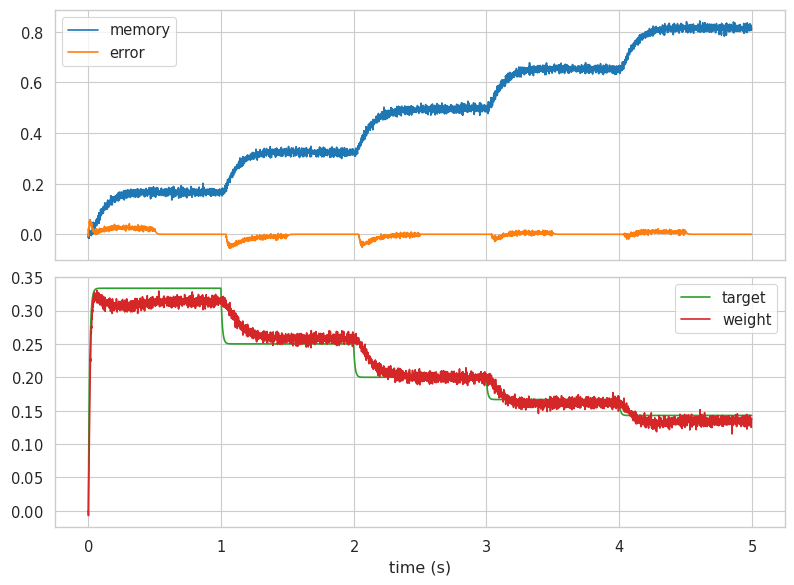

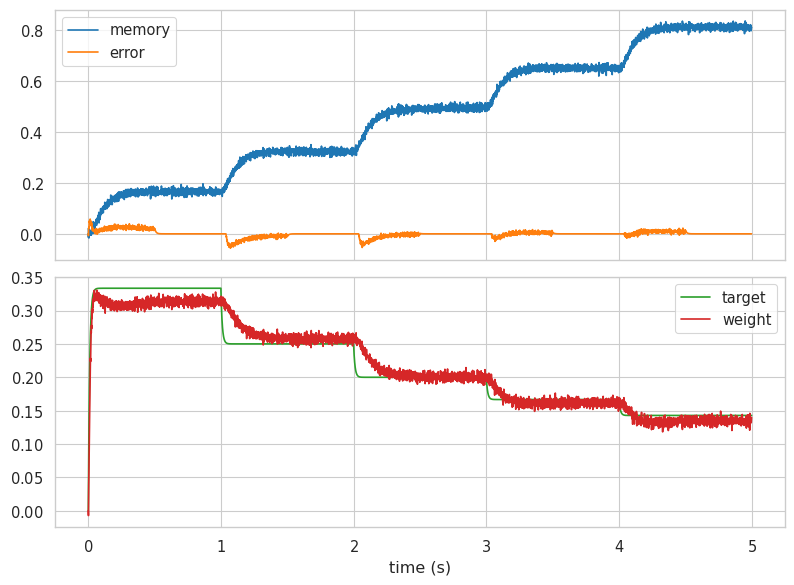

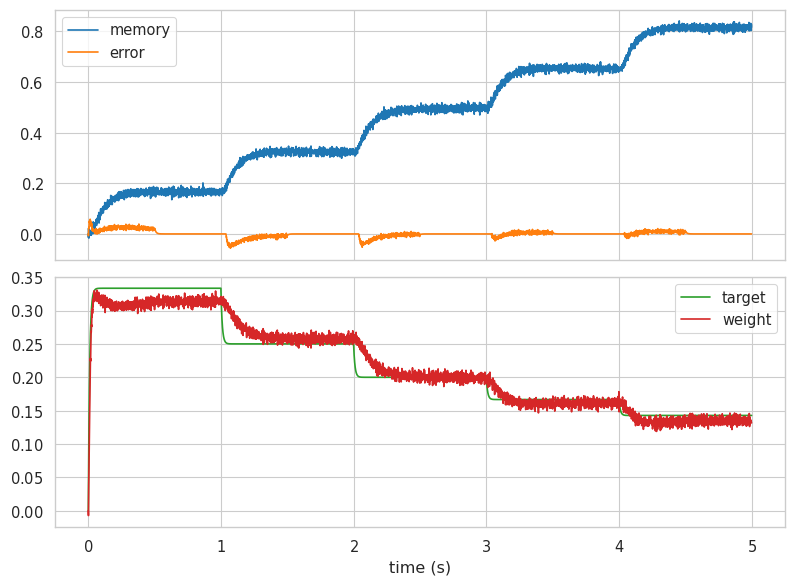

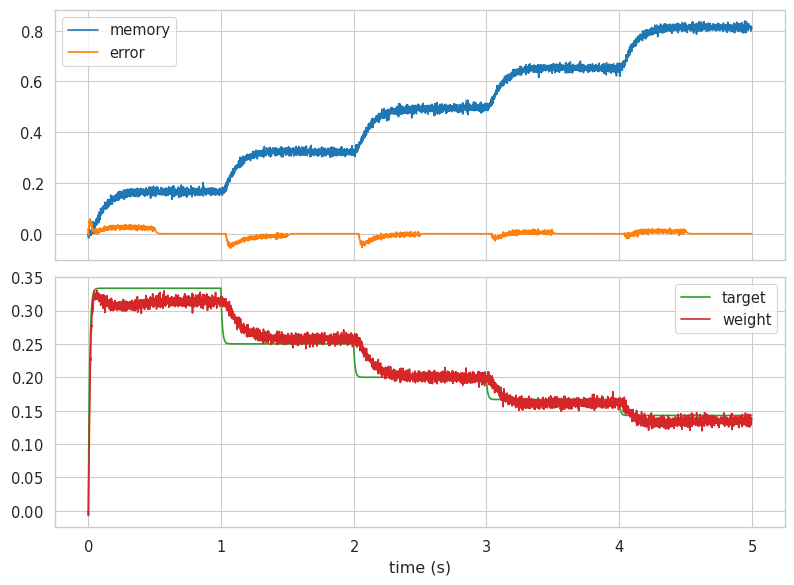

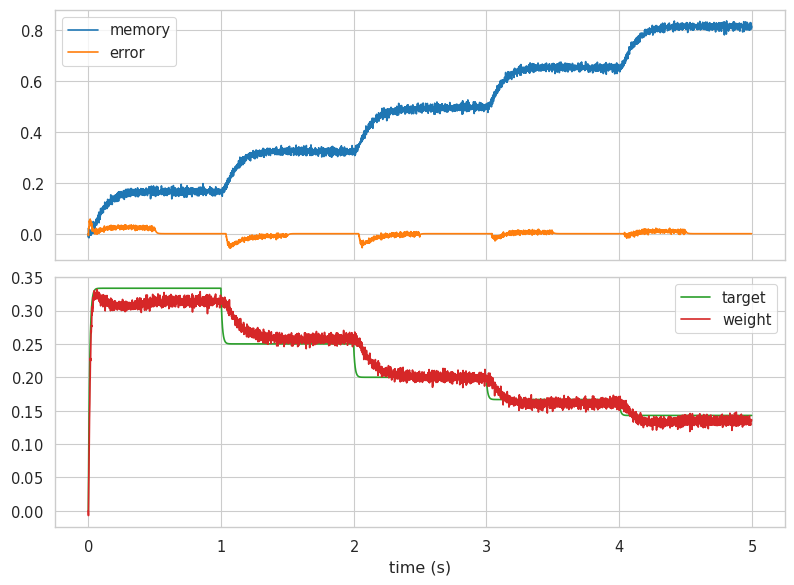

In [140]:
n_neurons = 1000
training_trials = 40
W = np.zeros((1, n_neurons))
for t in range(1, training_trials+1):
    print(f"training iteration {t}")
    env = Environment('carrabin', sid=1, trial=t)
    W = pretrain(W, env, n_neurons=n_neurons, train=True)

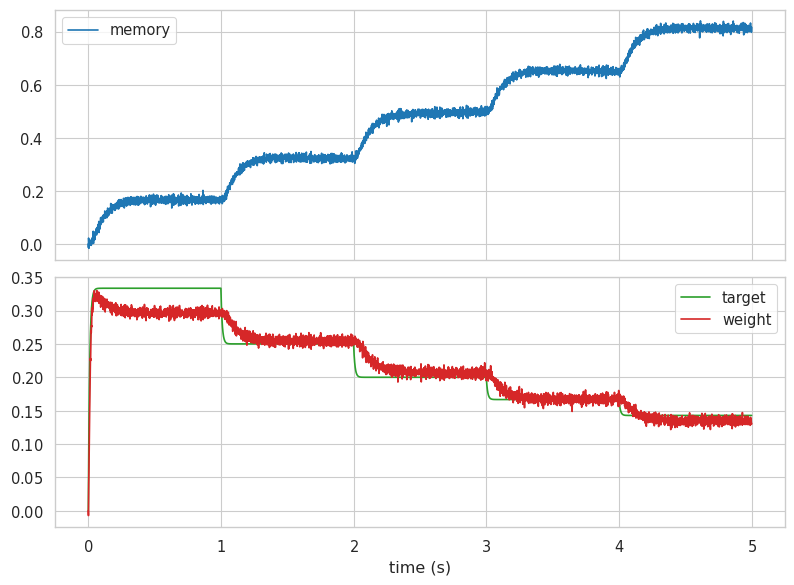

In [145]:
env = Environment('carrabin', sid=1, trial=1)
net, sim = pretrain(W, env, n_neurons=n_neurons, train=False)

# Add in NEF_syn components

In [31]:
def build_network_syn(learned_weights, env, n_neurons=1000, seed_net=0, syn=0.01, syn_fb=0.2,
                      radius=1, a=1e-4, alpha=6e-5, dt=0.001, lambd=0, train=False, plot=False):
    func_stim = lambda t: env.sample(t)
    func_context = lambda t: env.context
    func_weight = lambda t: np.power(int(t)+3, -lambd) if t!=-3 else 1
    func_stop = lambda t: 1 - np.abs(env.sample(t))

    w_inh_weight = -1000*np.ones((n_neurons, 1))
    w_inh_value = -1000*np.ones((int(n_neurons/2), 1))
    
    network = nengo.Network(seed=seed_net)
    with network:
        node_stim = nengo.Node(func_stim)
        node_target = nengo.Node(func_weight)
        node_stop = nengo.Node(func_stop)
        node_context = nengo.Node(func_context)
        
        stim = nengo.Ensemble(n_neurons, 1, seed=seed_net)
        delta = nengo.Ensemble(n_neurons, 1, encoders=nengo.dists.Choice([[1]]), intercepts=nengo.dists.Uniform(0,1), seed=seed_net)
        memory = nengo.Ensemble(n_neurons, 1, radius=radius, seed=seed_net)    
        weight = nengo.Ensemble(n_neurons, 1, seed=seed_net)
        context = nengo.Ensemble(n_neurons, env.dim_context, seed=seed_net)
        value = nengo.Ensemble(n_neurons, 1, seed=seed_net)
        if train:
            error_weight = nengo.Ensemble(n_neurons, 1, seed=seed_net)
        else:
            error_value = nengo.networks.Product(n_neurons, 1, seed=seed_net)

        nengo.Connection(node_stim, stim, seed=seed_net)
        nengo.Connection(node_context, context, seed=seed_net)
        nengo.Connection(stim, delta, synapse=syn, function=lambda x: 2*np.abs(x), seed=seed_net)
        nengo.Connection(stim, delta, synapse=0.1, function=lambda x: -2*np.abs(x), seed=seed_net)
        nengo.Connection(delta, memory, synapse=syn_fb, transform=syn_fb, seed=seed_net)
        nengo.Connection(memory, memory, synapse=syn_fb, seed=seed_net)
        if train:
            conn_weight = nengo.Connection(memory.neurons, weight, synapse=syn, seed=seed_net,
                                           transform=learned_weights, learning_rule_type=nengo.PES(learning_rate=a))
            nengo.Connection(node_target, error_weight, transform=1, seed=seed_net)
            nengo.Connection(weight, error_weight, transform=-1, seed=seed_net)
            nengo.Connection(error_weight, conn_weight.learning_rule, transform=-1, seed=seed_net)
            nengo.Connection(node_stop, error_weight.neurons, transform=w_inh_weight, seed=seed_net)
        else:
            conn_weight = nengo.Connection(memory.neurons, weight, transform=learned_weights, synapse=syn, seed=seed_net)
            conn_value = nengo.Connection(context, value, synapse=syn, seed=seed_net,
                                          learning_rule_type=nengo.PES(learning_rate=alpha), function=lambda x: 0)
            nengo.Connection(stim, error_value.input_a, synapse=syn)
            nengo.Connection(value, error_value.input_a, transform=-1, synapse=syn, seed=seed_net)
            nengo.Connection(weight, error_value.input_b, synapse=syn, seed=seed_net)
            nengo.Connection(error_value.output, conn_value.learning_rule, synapse=syn, transform=-1, seed=seed_net)
            nengo.Connection(node_stop, error_value.sq1.ea_ensembles[0].neurons, transform=w_inh_value, seed=seed_net)
            nengo.Connection(node_stop, error_value.sq2.ea_ensembles[0].neurons, transform=w_inh_value, seed=seed_net)

        probe_stim = nengo.Probe(stim, synapse=syn)
        probe_target = nengo.Probe(node_target, synapse=syn)
        probe_delta = nengo.Probe(delta, synapse=syn)
        probe_memory = nengo.Probe(memory, synapse=syn)
        probe_weight = nengo.Probe(weight, synapse=syn)
        probe_value = nengo.Probe(value, synapse=syn)
        if train:
            probe_error_weight = nengo.Probe(error_weight, synapse=0.01)
            probe_learned_weights = nengo.Probe(conn_weight, "weights")
        else:
            probe_error_value = nengo.Probe(error_value.output, synapse=0.01)
        network.probe_target = probe_target
        network.probe_weight = probe_weight

    sim = nengo.Simulator(network, dt=dt, progress_bar=False)
    with sim:
        sim.run(5-dt)

    if train:
        learned_weights = sim.data[probe_learned_weights][-1]
        if plot:
            with sns.axes_style("whitegrid"):  # This enables gridlines
                fig, axes = plt.subplots(nrows=2, sharex=True, figsize=(8,6))
                # sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_stim].flatten(), label='observations', color=palette[0], ax=axes[0])
                sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_memory].flatten(), label='memory', color=palette[0], ax=axes[0])
                sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_error_weight].flatten(), label='error', color=palette[1], ax=axes[0])
                sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_target].flatten(), label='target', color=palette[2], ax=axes[1])
                sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_weight].flatten(), label='weight', color=palette[3], ax=axes[1])
                # axes[0].set(title=f"training iteration {seed_stim}")
                axes[1].set(xlabel='time (s)')
                plt.grid(True, axis='y')  # Enable only y-axis gridlines
                fig.tight_layout()
                plt.show()
                plt.close('all')
    else:
        if plot:
            with sns.axes_style("whitegrid"):  # This enables gridlines
                fig, axes = plt.subplots(nrows=1, sharex=True, figsize=(8,3))
                sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_stim].flatten(), label='observations', color=palette[0], ax=axes)
                sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_value].flatten(), label='value', color=palette[1], ax=axes)
                sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_error_value].flatten(), label='error', color=palette[2], ax=axes)
                axes.set(xlabel='time (s)')
                plt.grid(True, axis='y')  # Enable only y-axis gridlines
                fig.tight_layout()
    if train:
        return learned_weights
    else:
        return network, sim

training iteration 1
training iteration 2
training iteration 3
training iteration 4
training iteration 5
training iteration 6
training iteration 7
training iteration 8
training iteration 9
training iteration 10
training iteration 11
training iteration 12
training iteration 13
training iteration 14
training iteration 15
training iteration 16
training iteration 17
training iteration 18
training iteration 19
training iteration 20
training iteration 21


/tmp/ipykernel_360461/507244038.py:73: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(nrows=2, sharex=True, figsize=(8,6))


training iteration 22
training iteration 23
training iteration 24
training iteration 25
training iteration 26
training iteration 27
training iteration 28
training iteration 29
training iteration 30
training iteration 31
training iteration 32
training iteration 33
training iteration 34
training iteration 35
training iteration 36
training iteration 37
training iteration 38
training iteration 39
training iteration 40


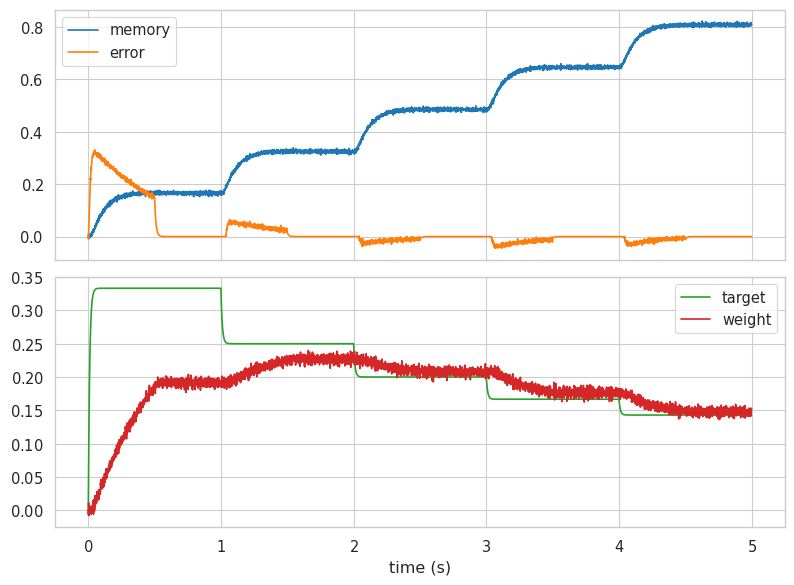

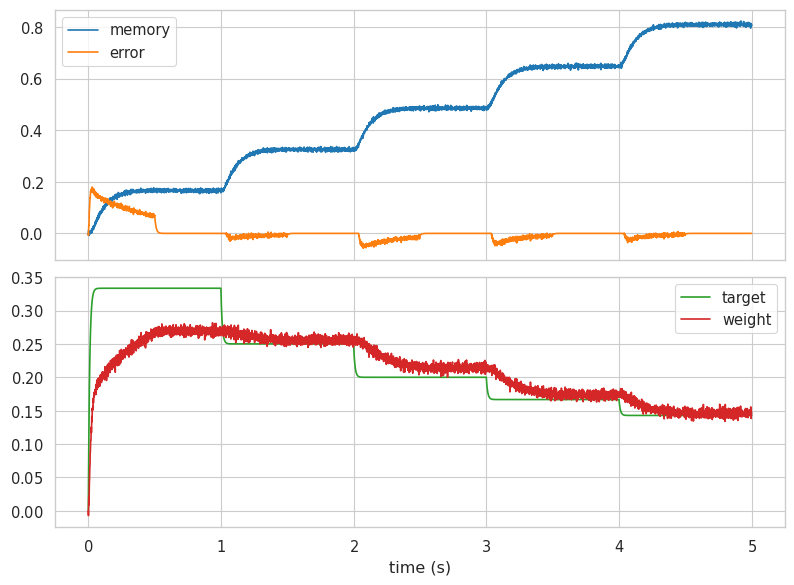

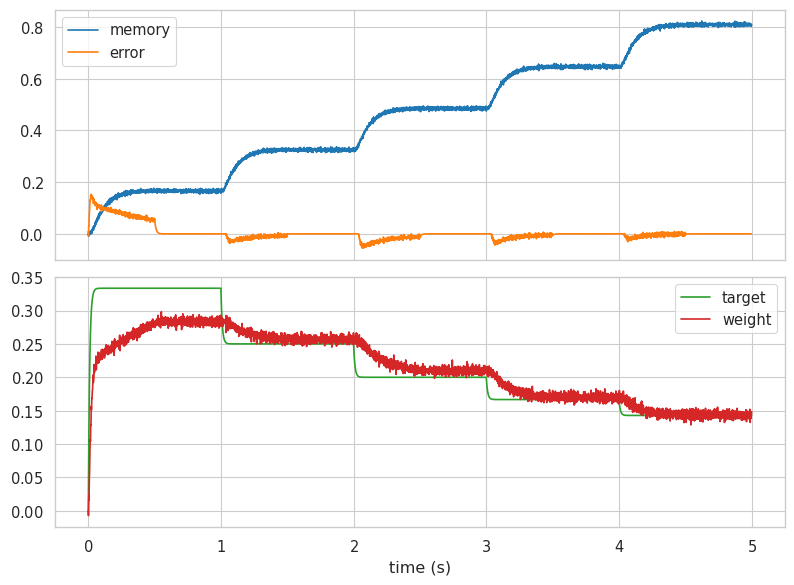

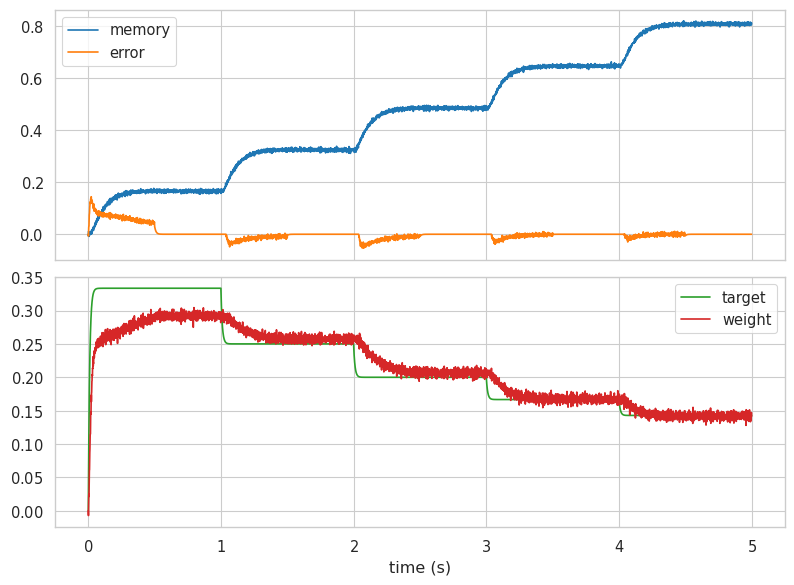

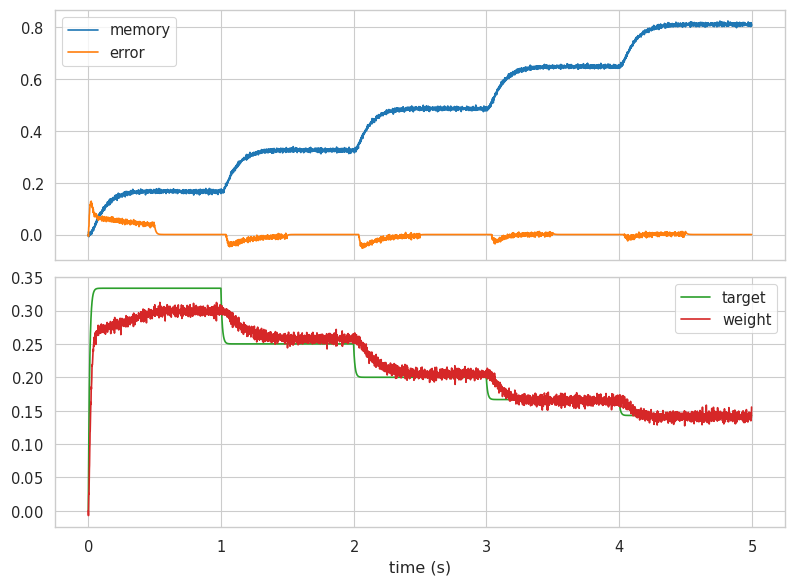

...

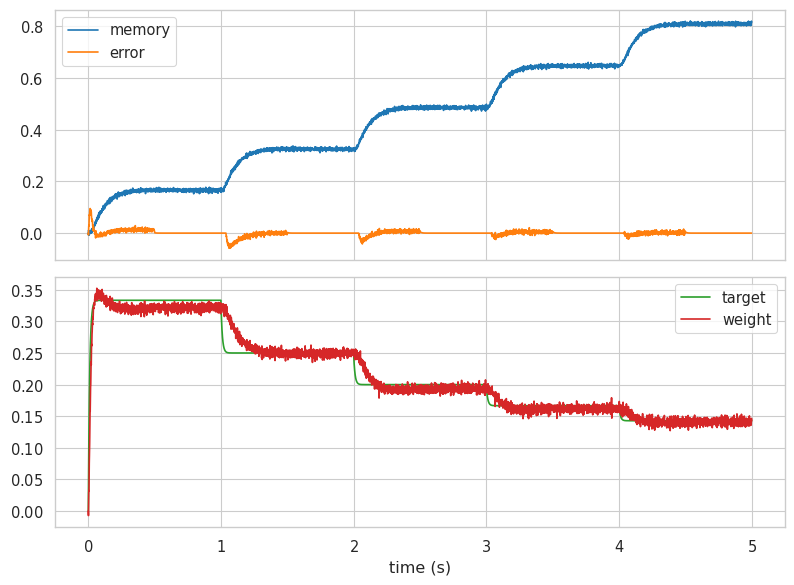

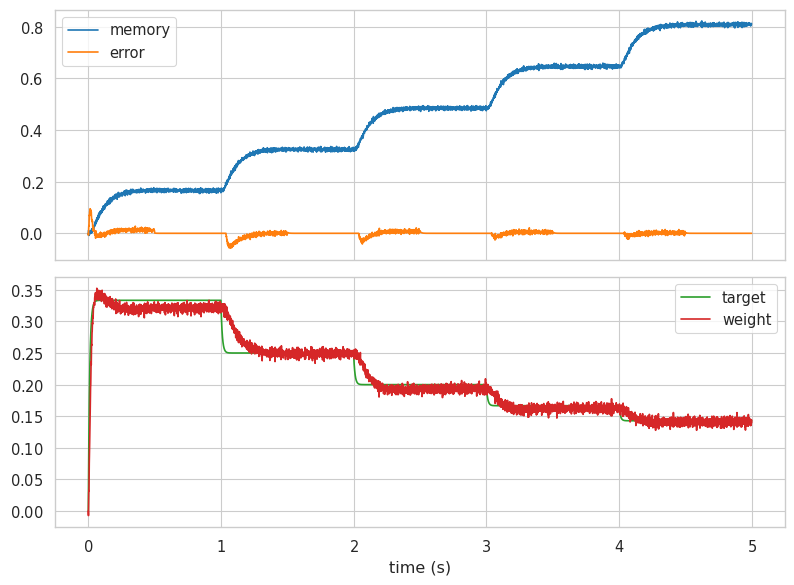

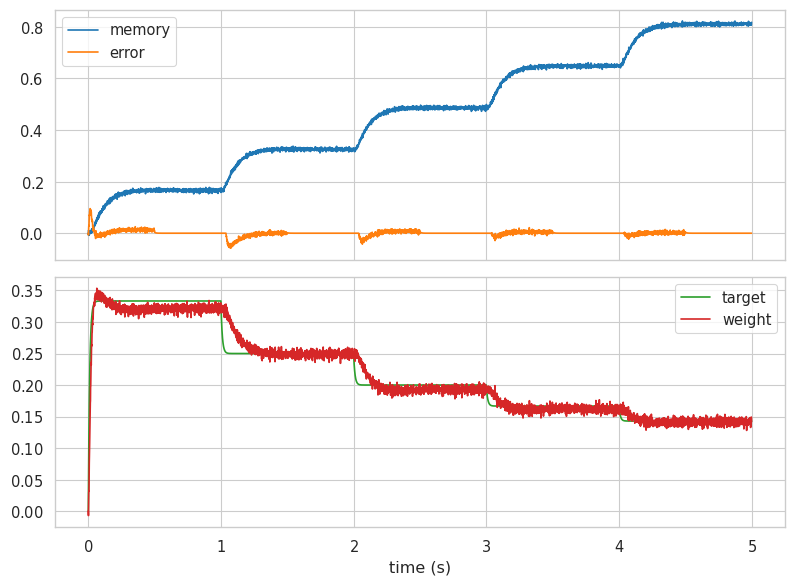

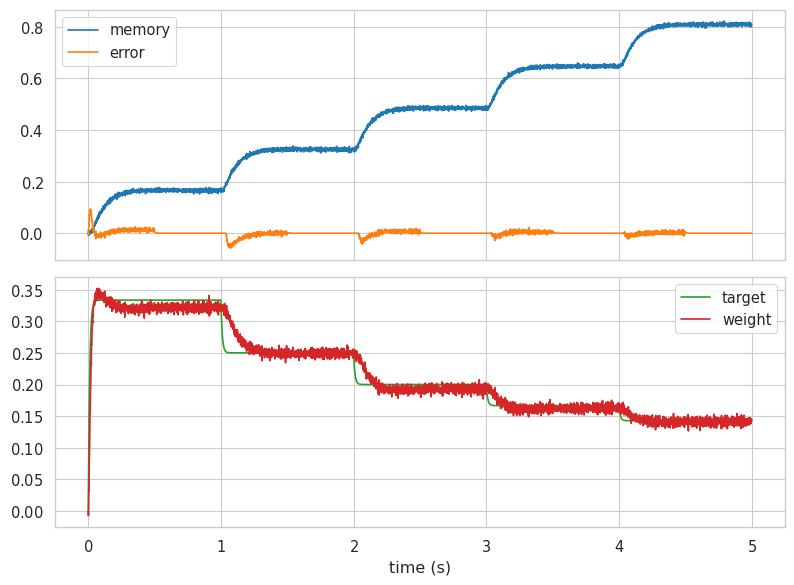

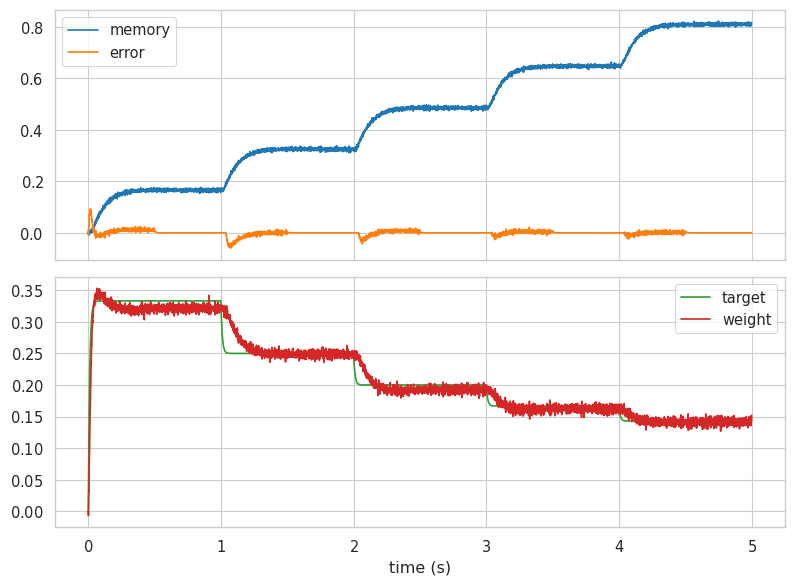

In [178]:
n_neurons = 1000
training_trials = 40
lambd = 1.0
W = np.zeros((1, n_neurons))
for t in range(1, training_trials+1):
    print(f"training iteration {t}")
    env = Environment('carrabin', sid=1, trial=t)
    W = build_network_syn(W, env, n_neurons=n_neurons, lambd=lambd, train=True)

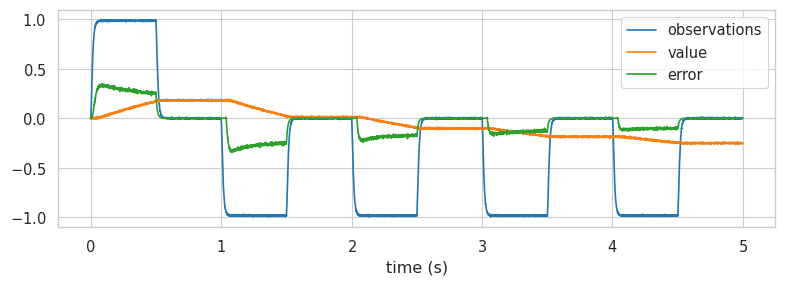

In [181]:
env = Environment('carrabin', sid=1, trial=1)
net, sim = build_network_syn(W, env, n_neurons=n_neurons, lambd=lambd, train=False)

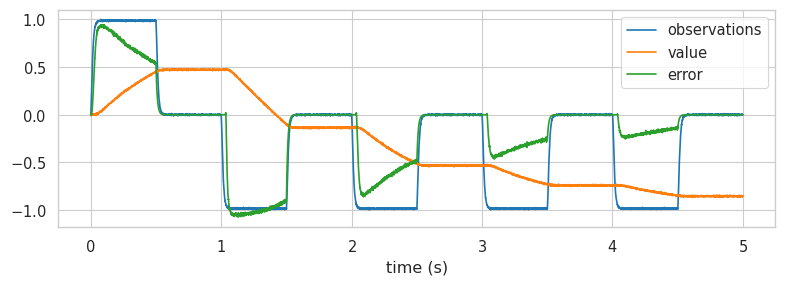

In [175]:
env = Environment('carrabin', sid=1, trial=1)
net, sim = build_network_syn(W, env, n_neurons=n_neurons, lambd=0, train=False)

# Add in NEF_rec components

In [32]:
def build_network_rec(learned_weights, env, n_neurons=1000, seed_net=0, syn=0.01, syn_fb=0.2,
                      radius=1, a=1e-4, alpha=0.2, dt=0.001, lambd=0, train=False, plot=False):
    func_stim = lambda t: env.sample(t)
    func_weight = lambda t: np.power(int(t)+3, -lambd) if t!=-3 else 1
    func_stop = lambda t: 1 - np.abs(env.sample(t))

    w_inh_weight = -1000*np.ones((n_neurons, 1))
    w_inh_value = -1000*np.ones((int(n_neurons/2), 1))
    
    network = nengo.Network(seed=seed_net)
    with network:
        node_stim = nengo.Node(func_stim)
        node_target = nengo.Node(func_weight)
        node_stop = nengo.Node(func_stop)
        
        stim = nengo.Ensemble(n_neurons, 1, seed=seed_net)
        delta = nengo.Ensemble(n_neurons, 1, encoders=nengo.dists.Choice([[1]]), intercepts=nengo.dists.Uniform(0,1), seed=seed_net)
        memory = nengo.Ensemble(n_neurons, 1, radius=radius, seed=seed_net)    
        weight = nengo.Ensemble(n_neurons, 1, seed=seed_net)
        value = nengo.Ensemble(n_neurons, 1, seed=seed_net)
        if train:
            error_weight = nengo.Ensemble(n_neurons, 1, seed=seed_net)
        else:
            error_value = nengo.networks.Product(n_neurons, 1, seed=seed_net)

        nengo.Connection(node_stim, stim, seed=seed_net)
        nengo.Connection(stim, delta, synapse=syn, function=lambda x: 2*np.abs(x), seed=seed_net)
        nengo.Connection(stim, delta, synapse=0.1, function=lambda x: -2*np.abs(x), seed=seed_net)
        nengo.Connection(delta, memory, synapse=syn_fb, transform=syn_fb, seed=seed_net)
        nengo.Connection(memory, memory, synapse=syn_fb, seed=seed_net)
        nengo.Connection(value, value, synapse=syn_fb, seed=seed_net)
        if train:
            conn_weight = nengo.Connection(memory.neurons, weight, synapse=syn, seed=seed_net,
                                           transform=learned_weights, learning_rule_type=nengo.PES(learning_rate=a))
            nengo.Connection(node_target, error_weight, transform=1, seed=seed_net)
            nengo.Connection(weight, error_weight, transform=-1, seed=seed_net)
            nengo.Connection(error_weight, conn_weight.learning_rule, transform=-1, seed=seed_net)
            nengo.Connection(node_stop, error_weight.neurons, transform=w_inh_weight, seed=seed_net)
        else:
            conn_weight = nengo.Connection(memory.neurons, weight, transform=learned_weights, synapse=syn, seed=seed_net)
            nengo.Connection(stim, error_value.input_a, synapse=syn)
            nengo.Connection(value, error_value.input_a, transform=-1, synapse=syn, seed=seed_net)
            nengo.Connection(weight, error_value.input_b, synapse=syn, seed=seed_net)
            nengo.Connection(error_value.output, value, transform=alpha, synapse=syn_fb, seed=seed_net)
            nengo.Connection(node_stop, error_value.sq1.ea_ensembles[0].neurons, transform=w_inh_value, seed=seed_net)
            nengo.Connection(node_stop, error_value.sq2.ea_ensembles[0].neurons, transform=w_inh_value, seed=seed_net)

        probe_stim = nengo.Probe(stim, synapse=syn)
        probe_target = nengo.Probe(node_target, synapse=syn)
        probe_delta = nengo.Probe(delta, synapse=syn)
        probe_memory = nengo.Probe(memory, synapse=syn)
        probe_weight = nengo.Probe(weight, synapse=syn)
        probe_value = nengo.Probe(value, synapse=syn)
        if train:
            probe_error_weight = nengo.Probe(error_weight, synapse=0.01)
            probe_learned_weights = nengo.Probe(conn_weight, "weights")
        else:
            probe_error_value = nengo.Probe(error_value.output, synapse=0.01)
        network.probe_target = probe_target
        network.probe_weight = probe_weight

    sim = nengo.Simulator(network, dt=dt, progress_bar=False)
    with sim:
        sim.run(5-dt)

    if train:
        learned_weights = sim.data[probe_learned_weights][-1]
        if plot:
            with sns.axes_style("whitegrid"):  # This enables gridlines
                fig, axes = plt.subplots(nrows=2, sharex=True, figsize=(8,6))
                # sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_stim].flatten(), label='observations', color=palette[0], ax=axes[0])
                sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_memory].flatten(), label='memory', color=palette[0], ax=axes[0])
                sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_error_weight].flatten(), label='error', color=palette[1], ax=axes[0])
                sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_target].flatten(), label='target', color=palette[2], ax=axes[1])
                sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_weight].flatten(), label='weight', color=palette[3], ax=axes[1])
                # axes[0].set(title=f"training iteration {seed_stim}")
                axes[1].set(xlabel='time (s)')
                plt.grid(True, axis='y')  # Enable only y-axis gridlines
                fig.tight_layout()
                plt.show()
                plt.close('all')
    else:
        if plot:
            with sns.axes_style("whitegrid"):  # This enables gridlines
                fig, axes = plt.subplots(nrows=1, sharex=True, figsize=(8,3))
                sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_stim].flatten(), label='observations', color=palette[0], ax=axes)
                sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_value].flatten(), label='value', color=palette[1], ax=axes)
                sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_error_value].flatten(), label='error', color=palette[2], ax=axes)
                axes.set(xlabel='time (s)')
                plt.grid(True, axis='y')  # Enable only y-axis gridlines
                fig.tight_layout()
    if train:
        return learned_weights
    else:
        return network, sim

training iteration 1


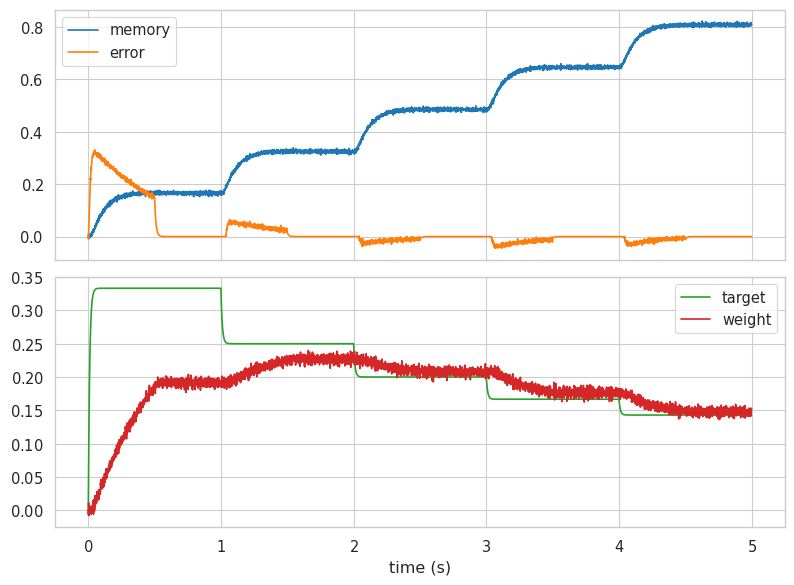

training iteration 2


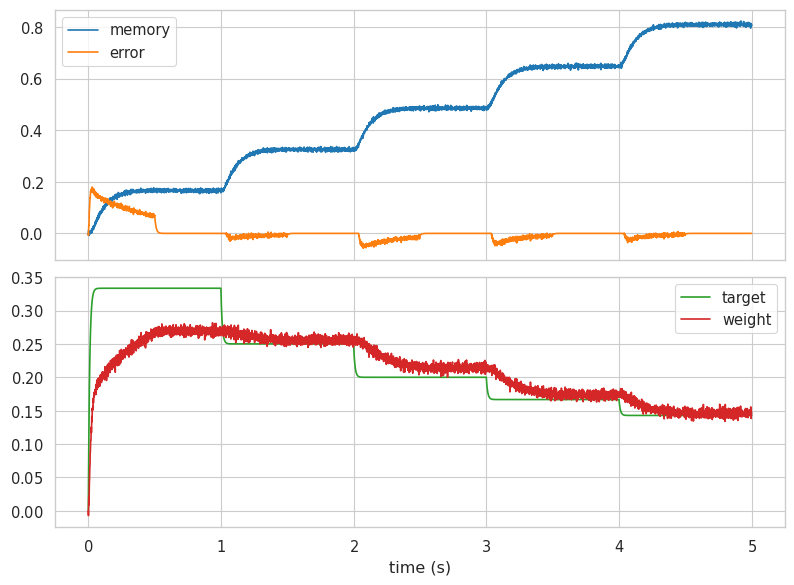

training iteration 3


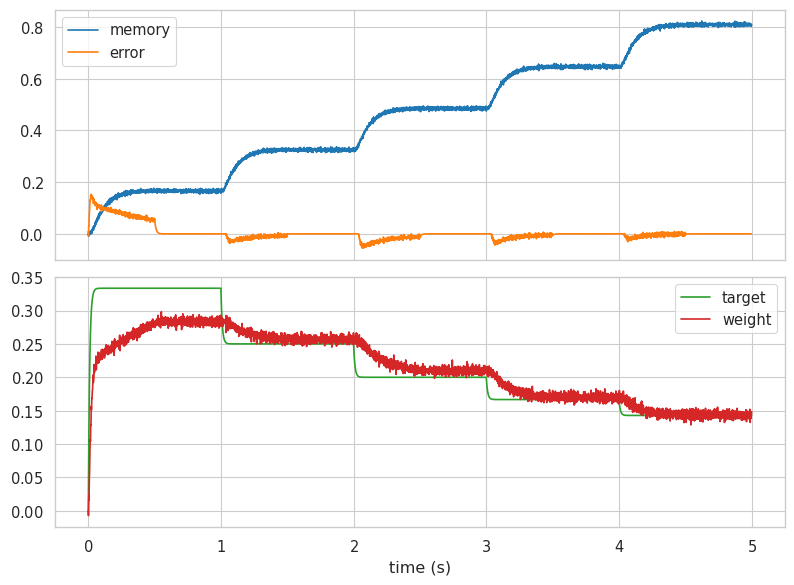

training iteration 4


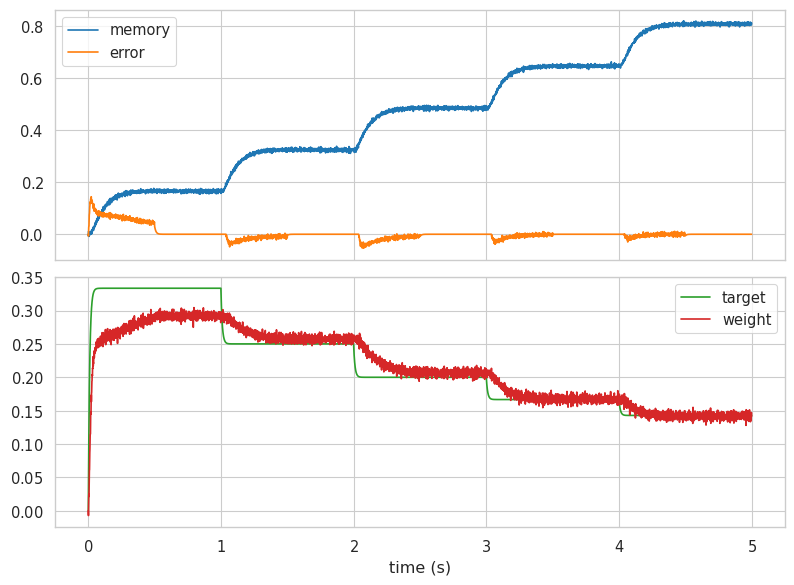

training iteration 5


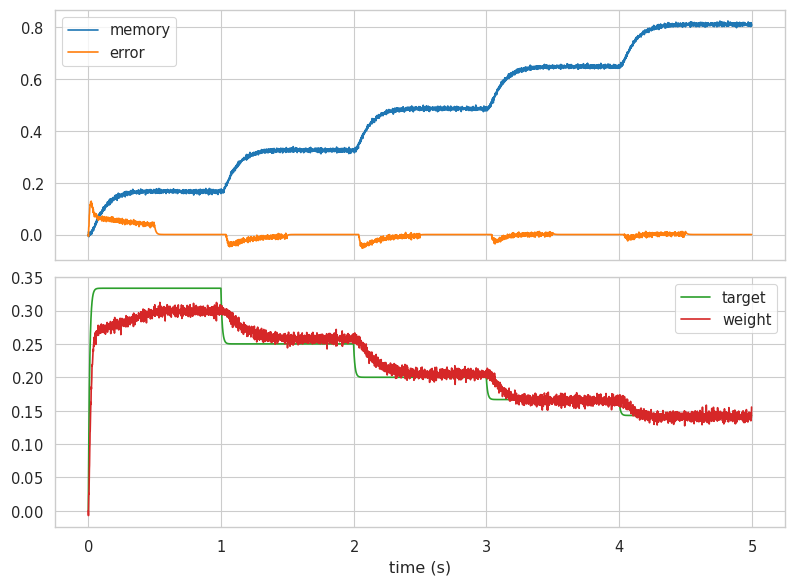

training iteration 6


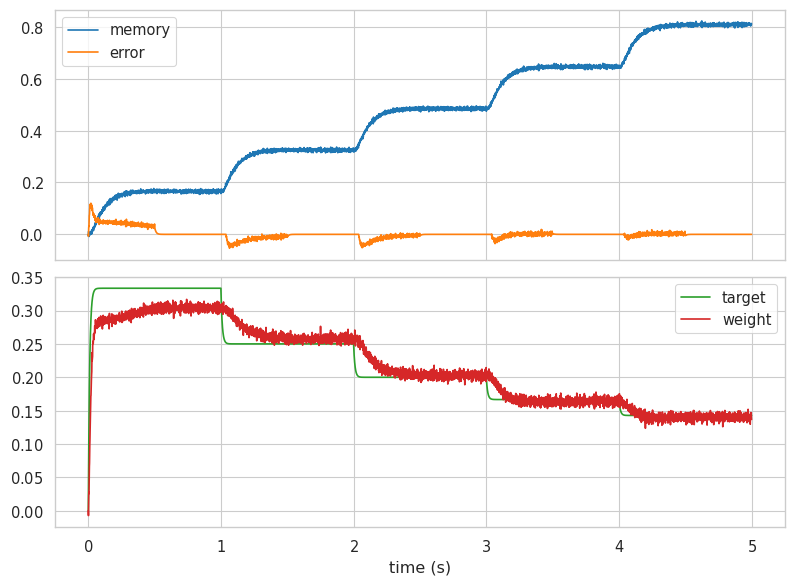

training iteration 7


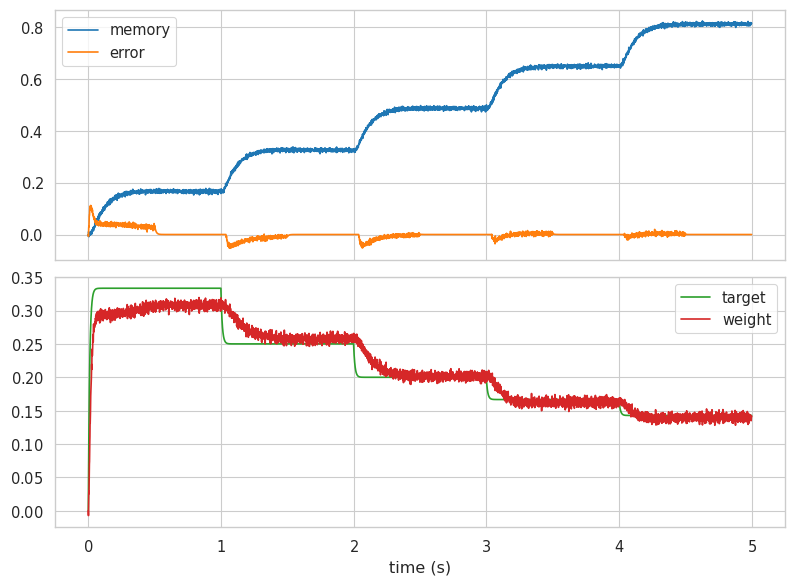

training iteration 8


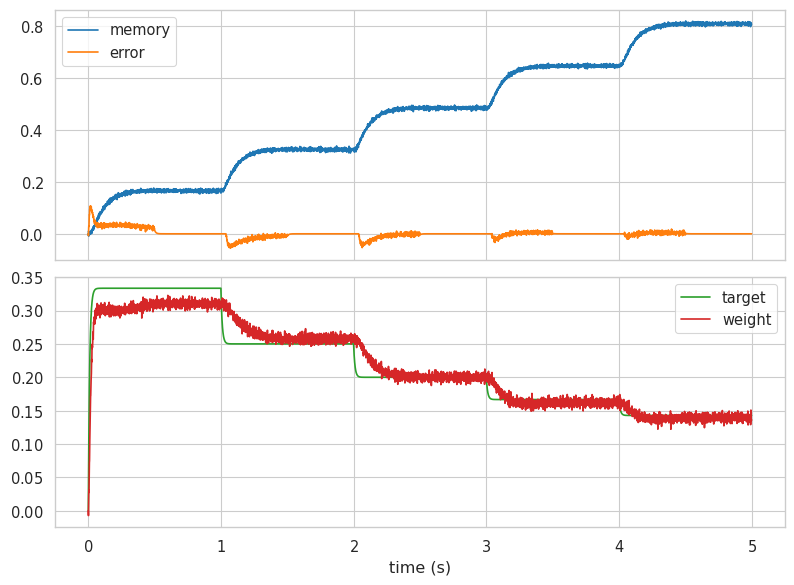

training iteration 9


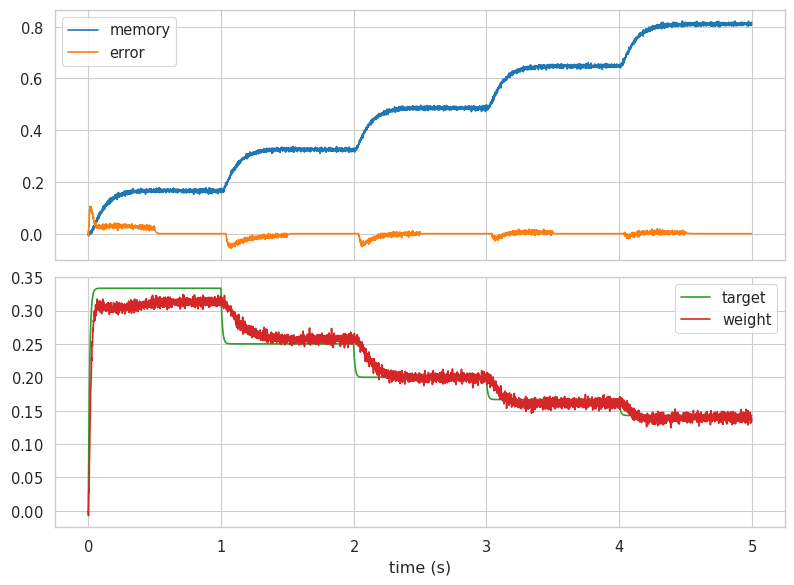

training iteration 10


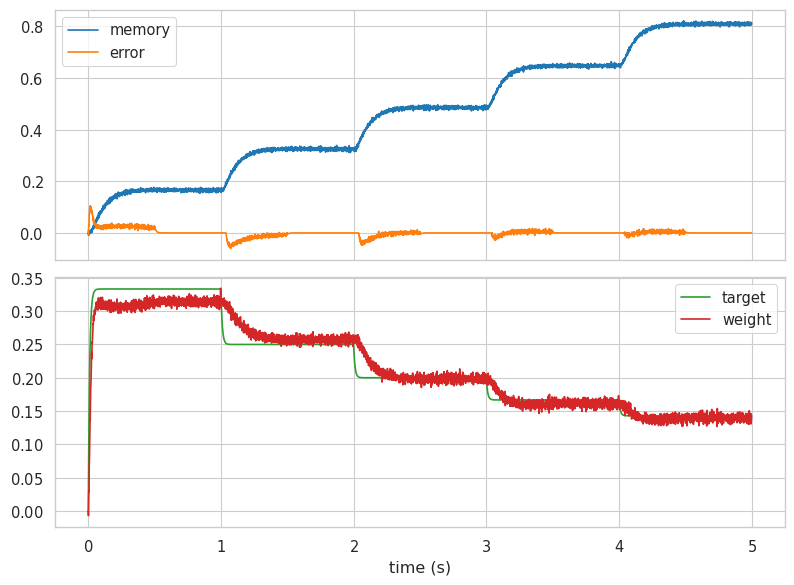

training iteration 11


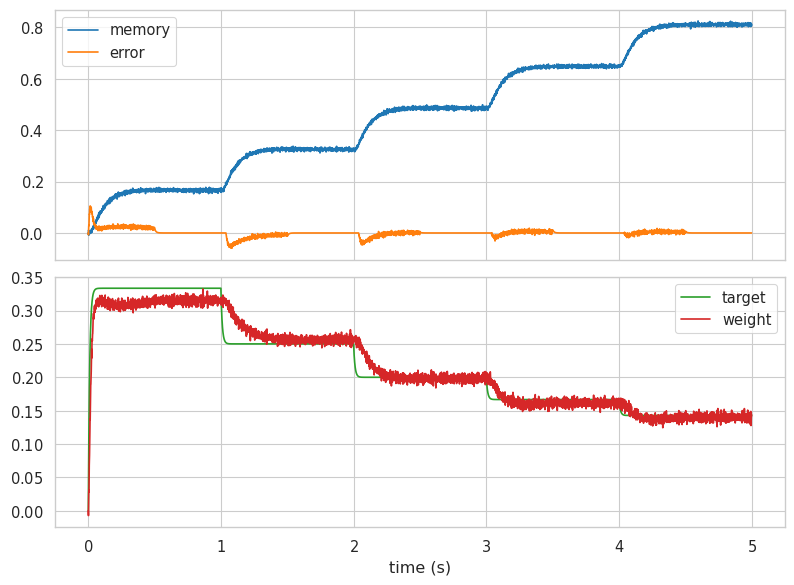

training iteration 12


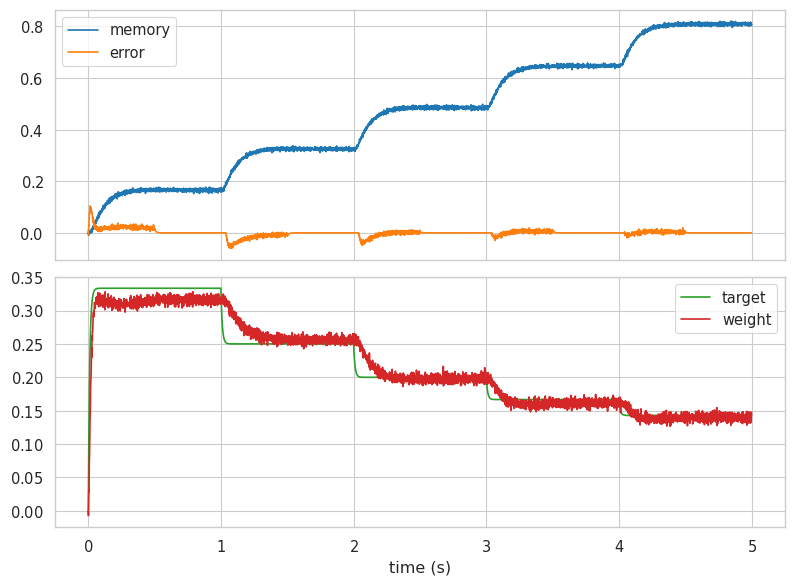

training iteration 13


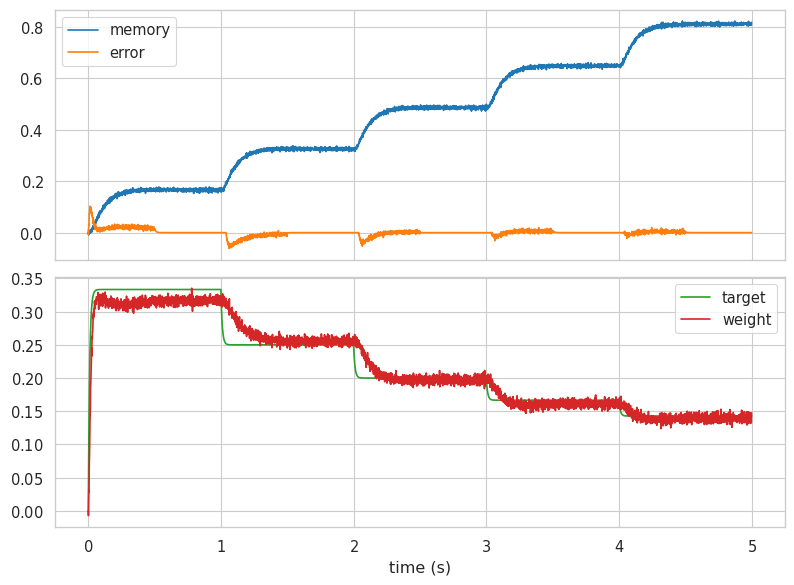

training iteration 14


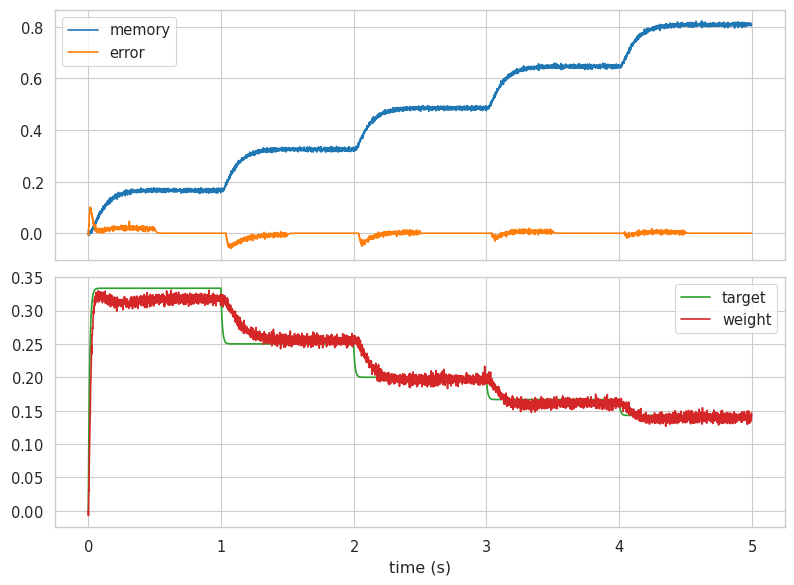

training iteration 15


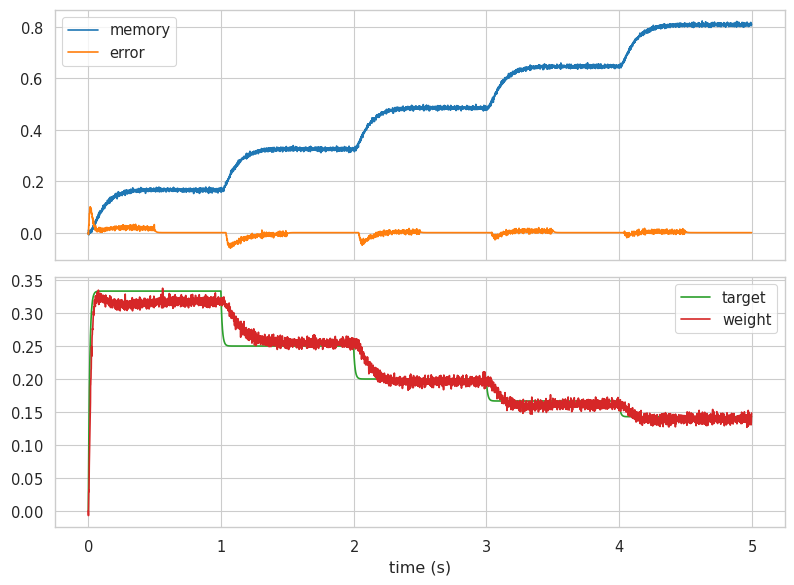

training iteration 16


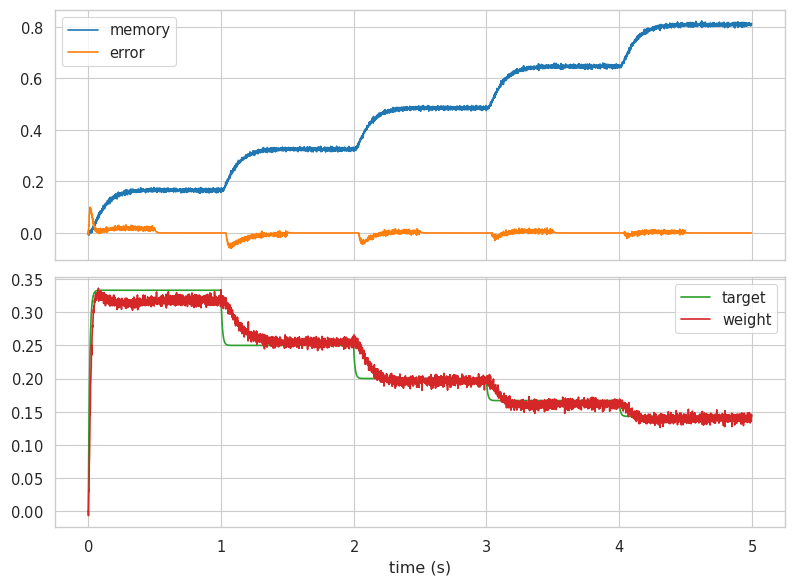

training iteration 17


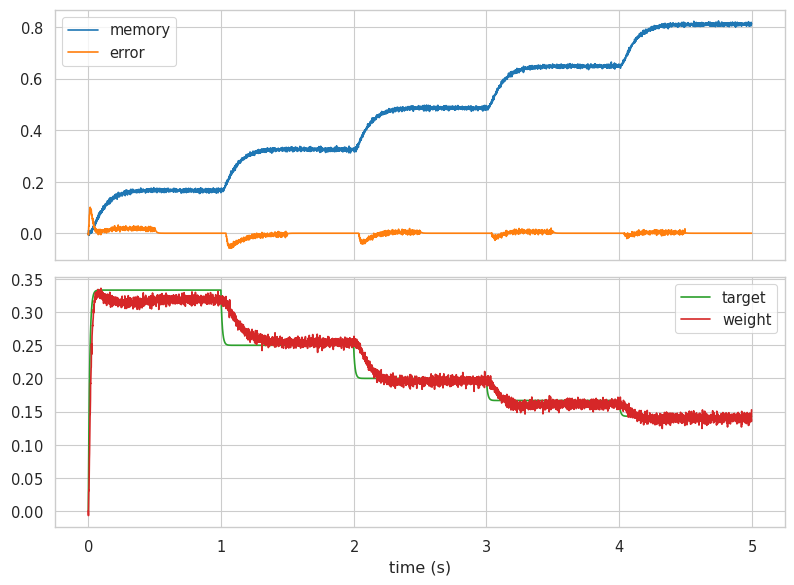

training iteration 18


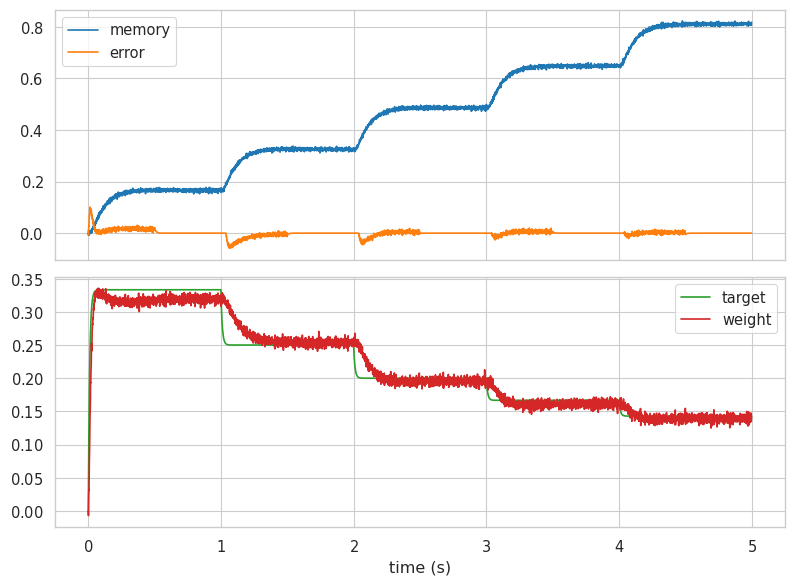

training iteration 19


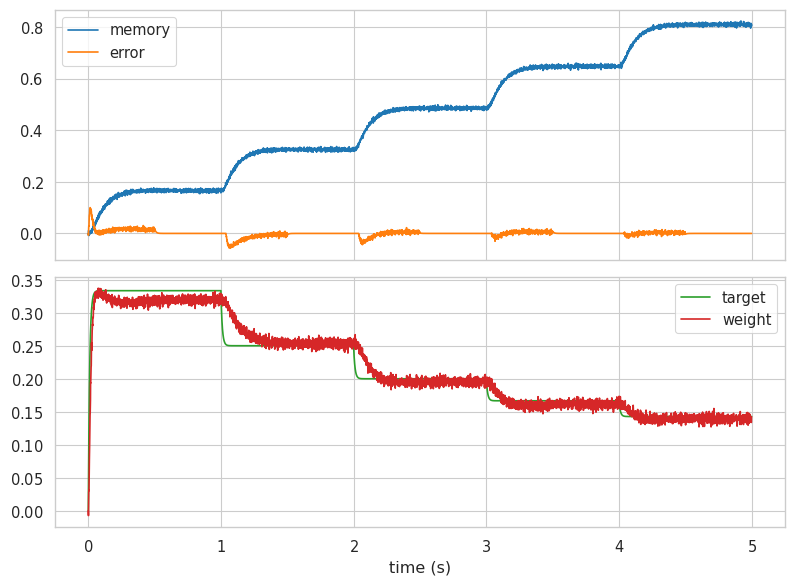

training iteration 20


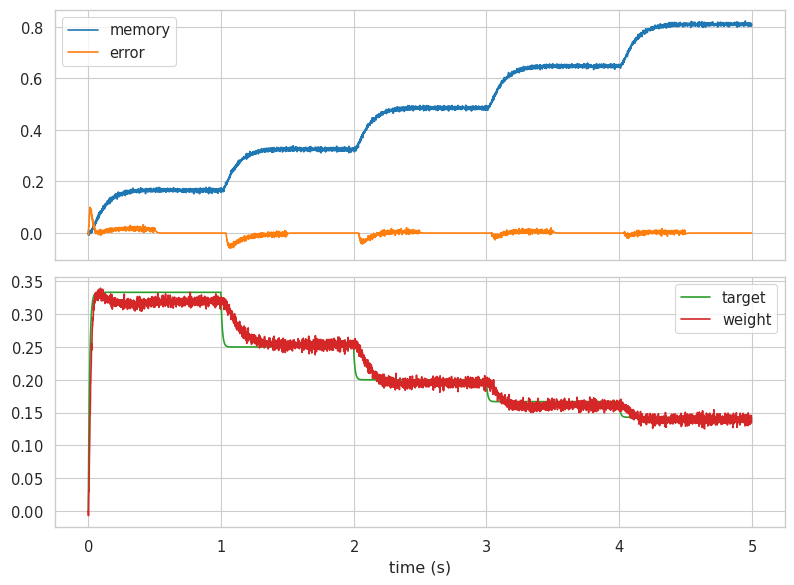

training iteration 21


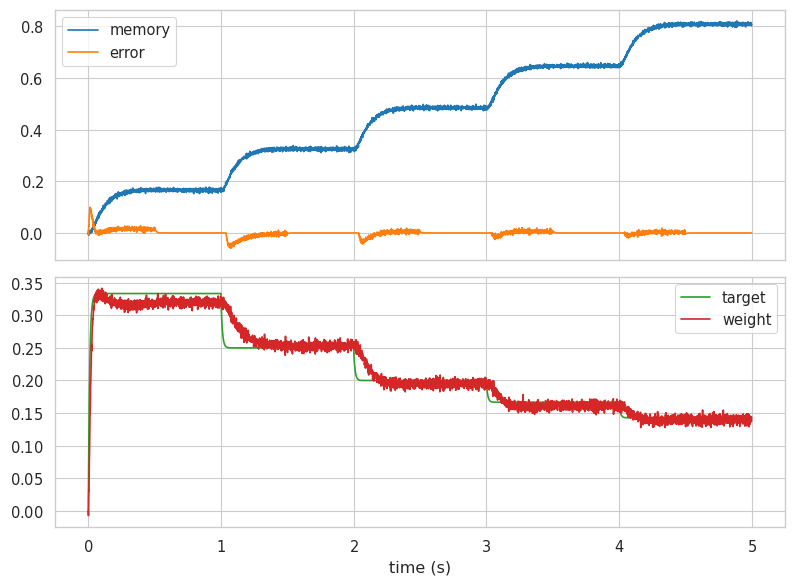

training iteration 22


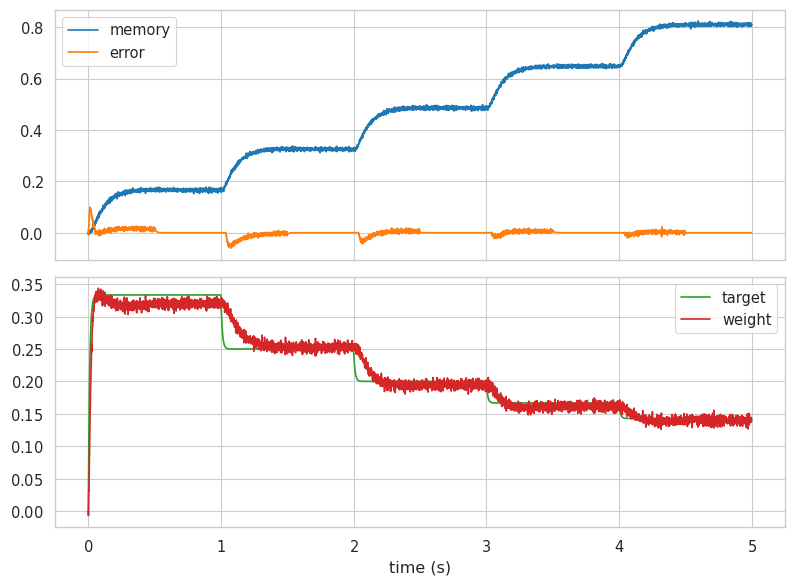

training iteration 23


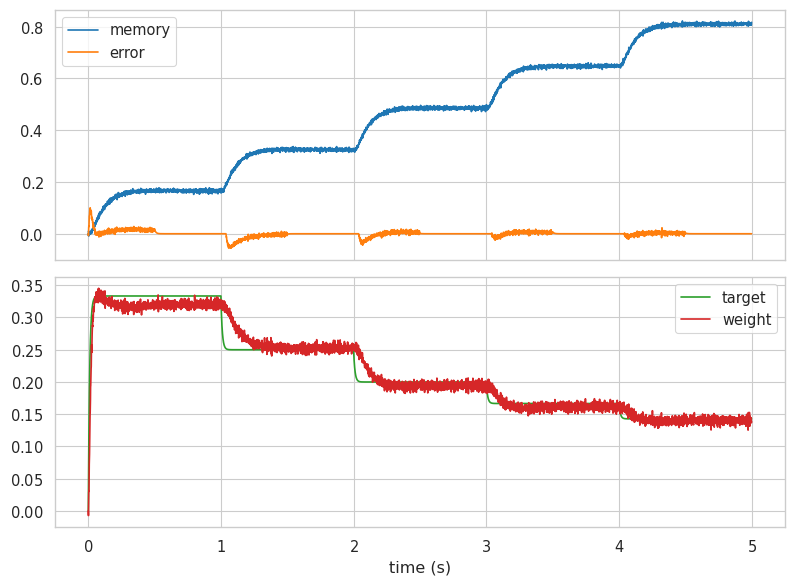

training iteration 24


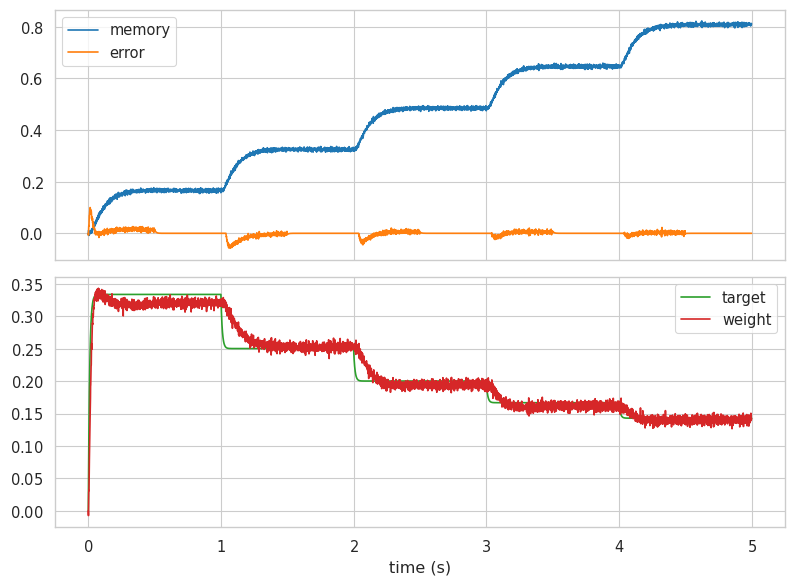

training iteration 25


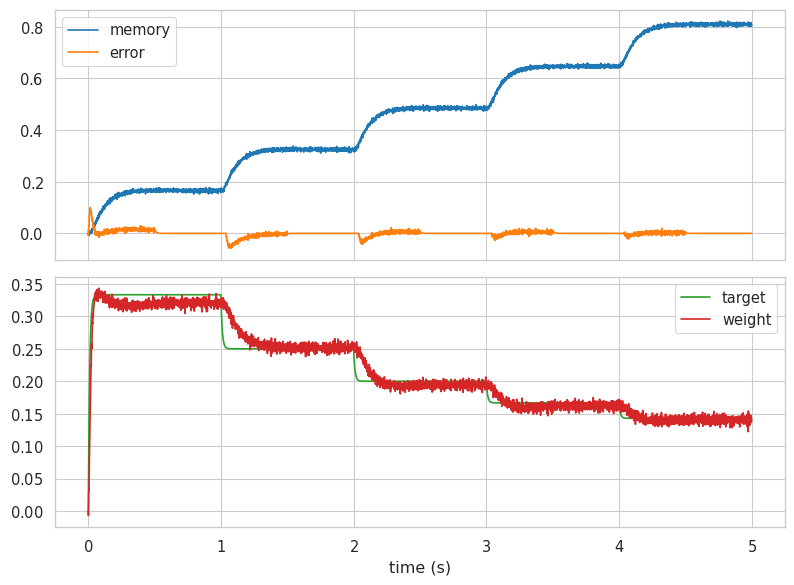

training iteration 26


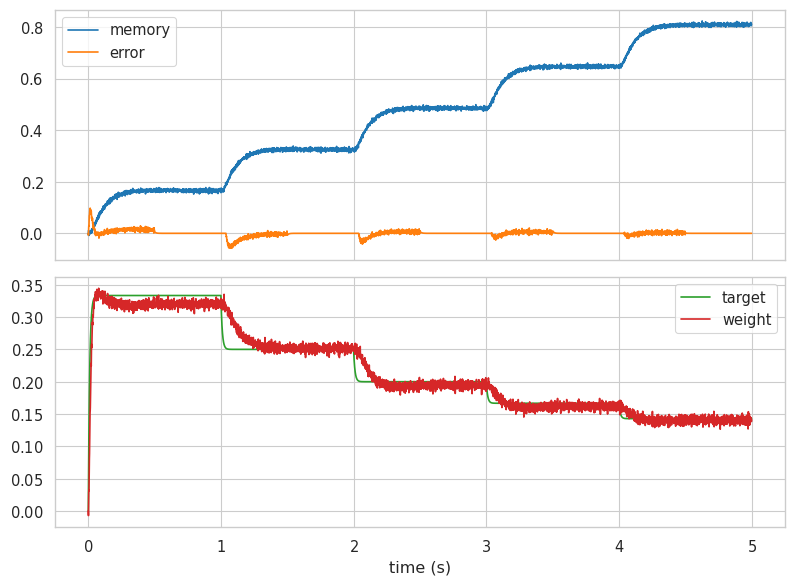

training iteration 27


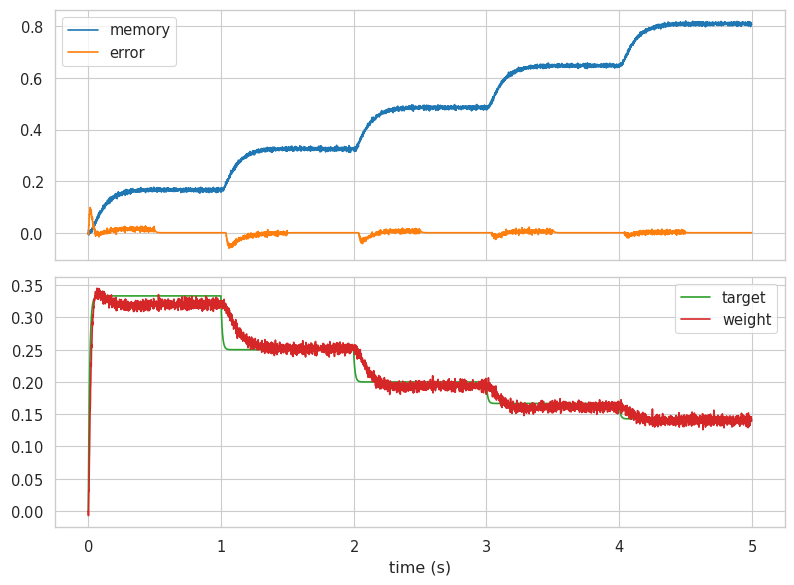

training iteration 28


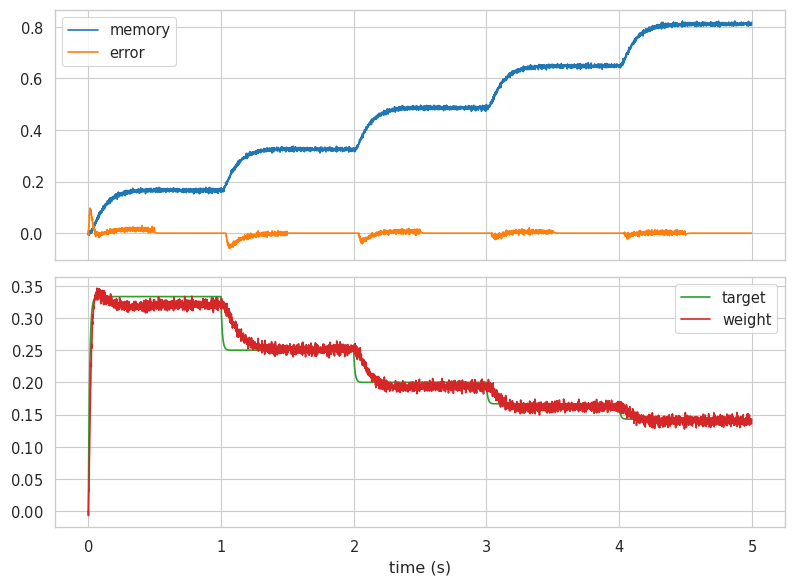

training iteration 29


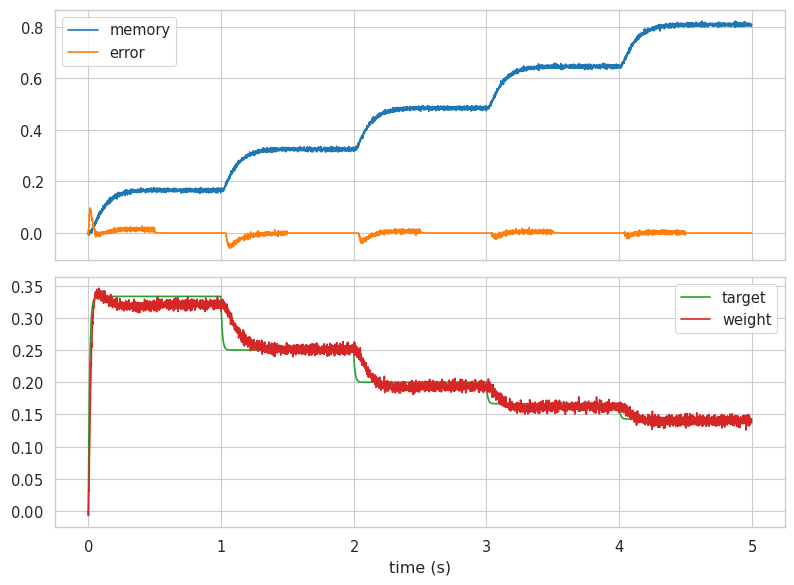

training iteration 30


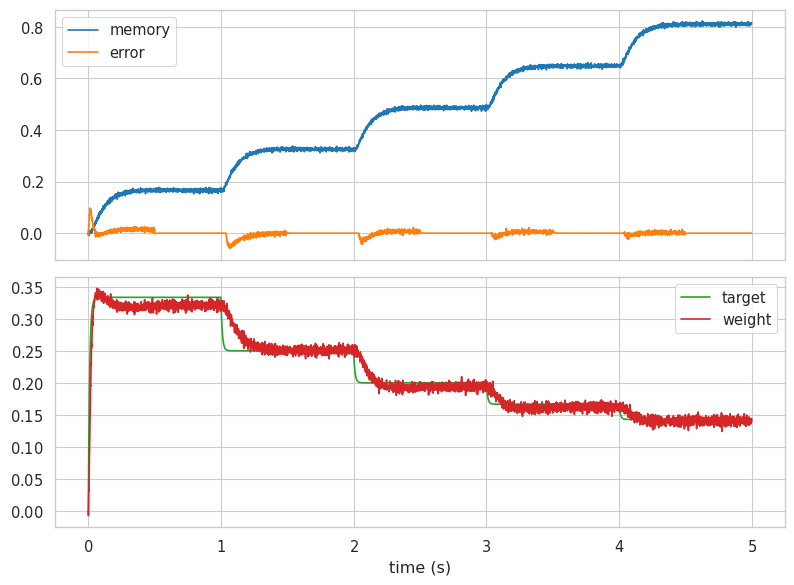

training iteration 31


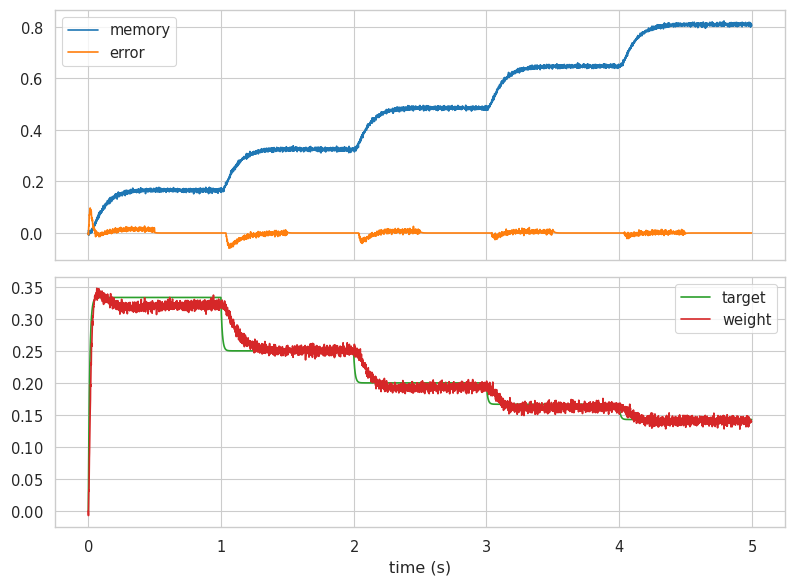

training iteration 32


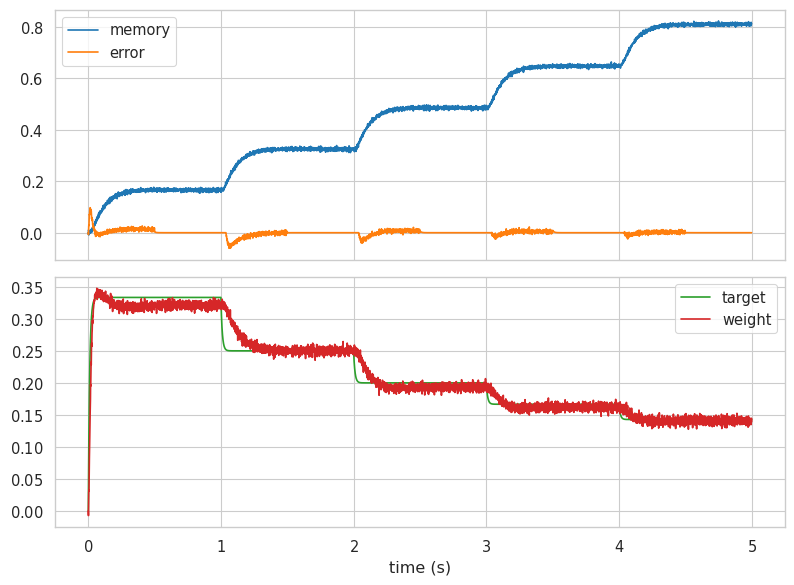

training iteration 33


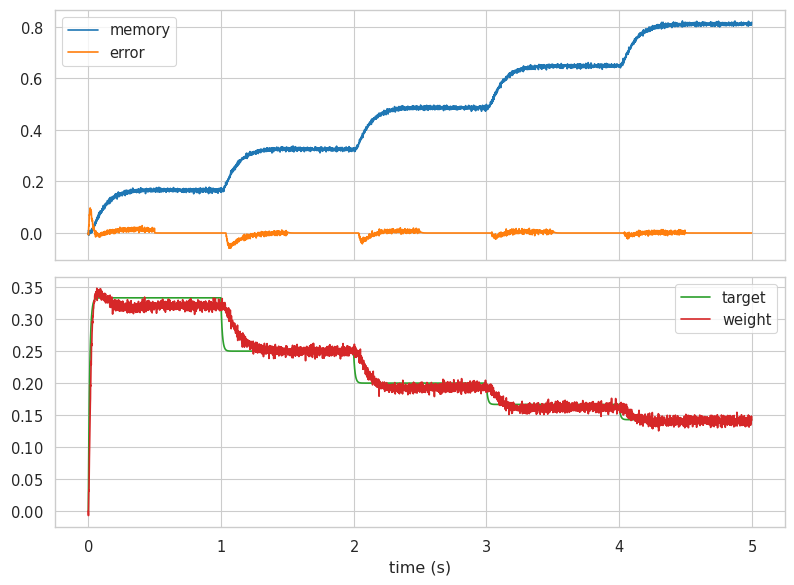

training iteration 34


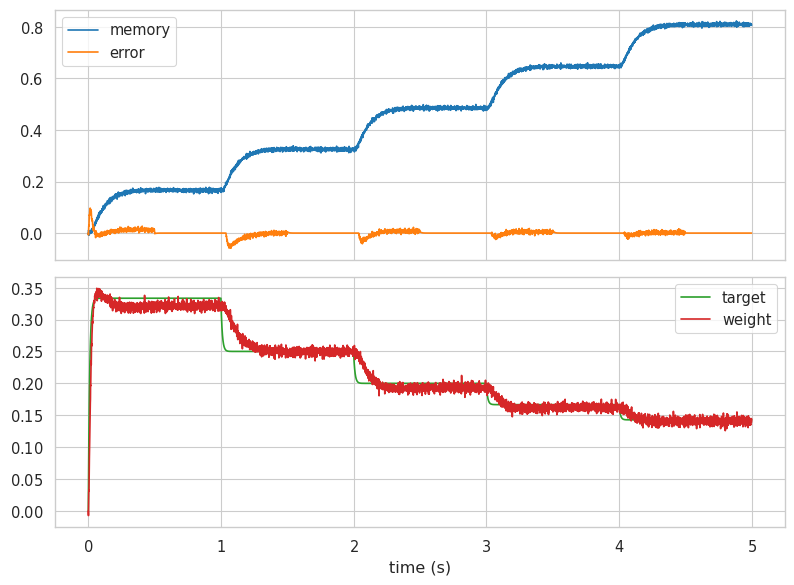

training iteration 35


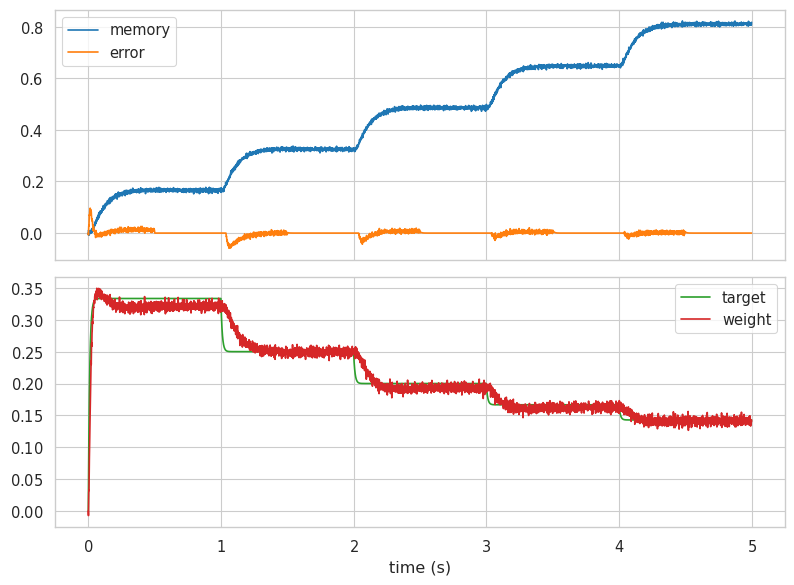

training iteration 36


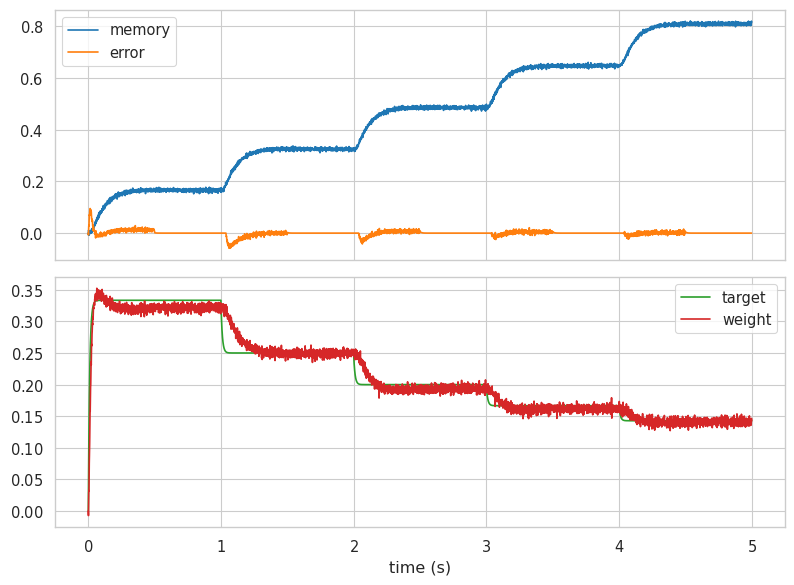

training iteration 37


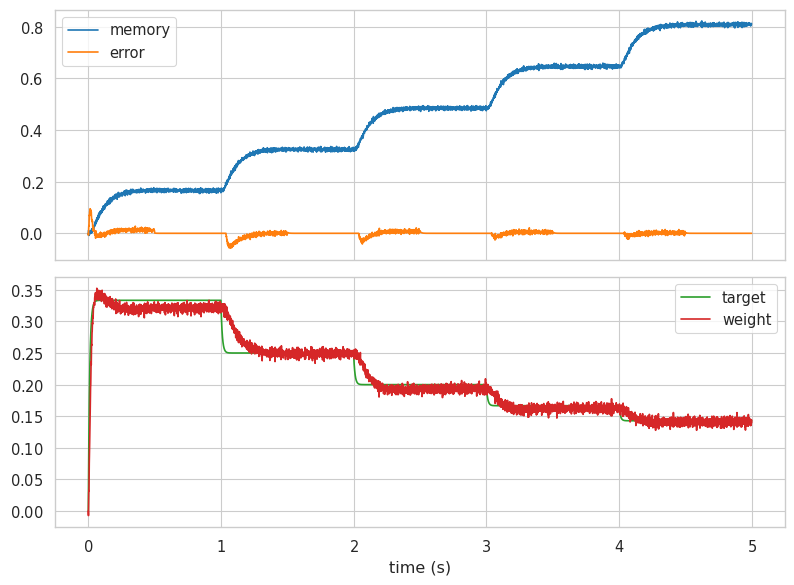

training iteration 38


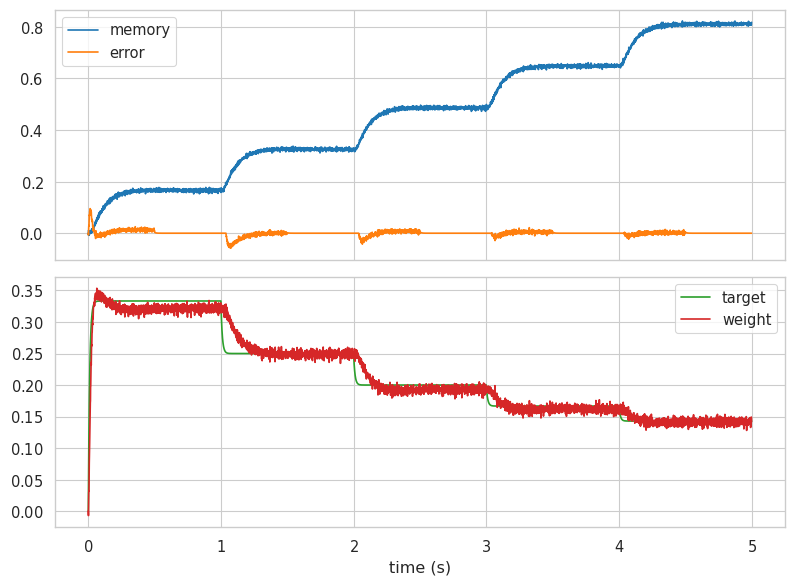

training iteration 39


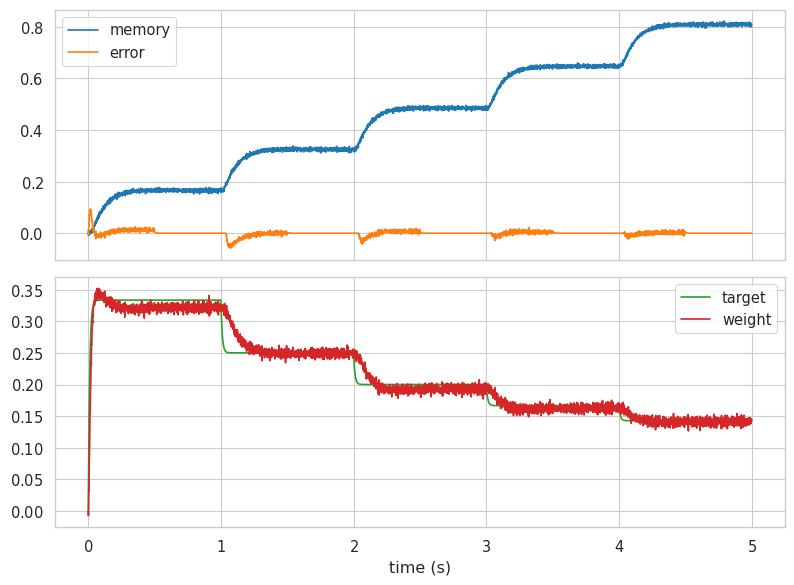

training iteration 40


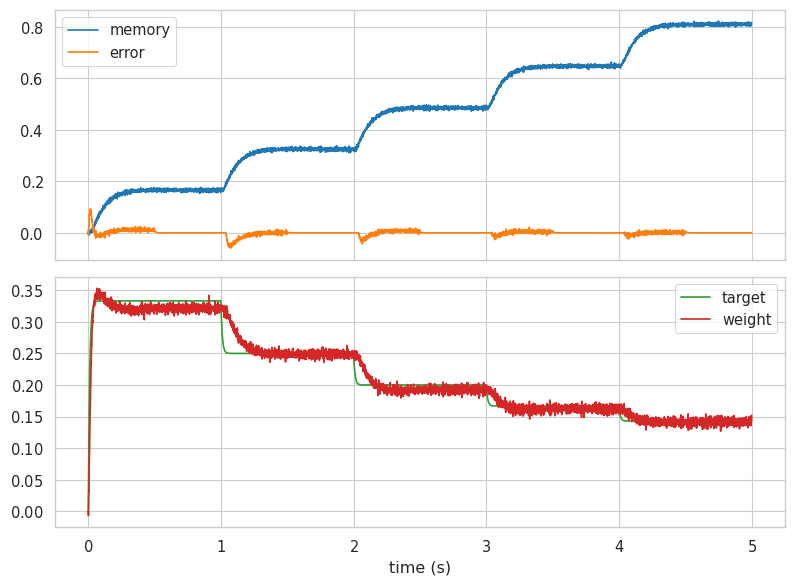

In [201]:
n_neurons = 1000
training_trials = 40
lambd = 1.0
W = np.zeros((1, n_neurons))
for t in range(1, training_trials+1):
    print(f"training iteration {t}")
    env = Environment('carrabin', sid=1, trial=t)
    W = build_network_rec(W, env, n_neurons=n_neurons, lambd=lambd, train=True)

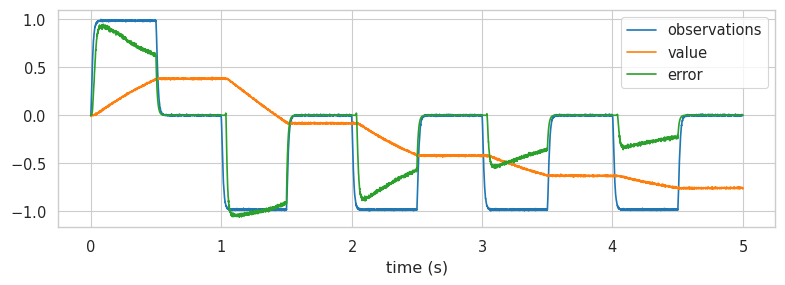

In [200]:
env = Environment('carrabin', sid=1, trial=1)
net, sim = build_network_rec(W, env, n_neurons=n_neurons, lambd=lambd, train=False)

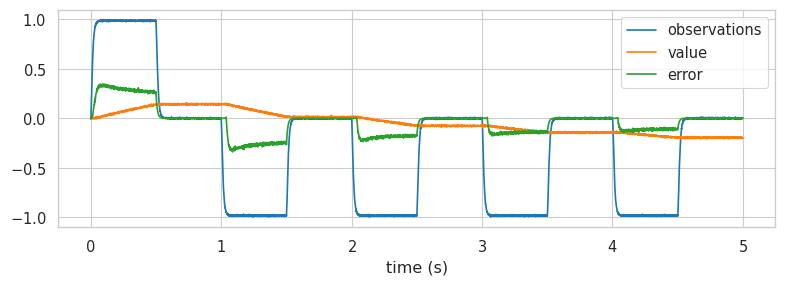

In [202]:
env = Environment('carrabin', sid=1, trial=1)
net, sim = build_network_rec(W, env, n_neurons=n_neurons, lambd=lambd, train=False)

# Noise analysis for weight component

In [33]:
n_neurons = [100, 250, 500, 1000, 2000]
sids = pd.read_pickle("data/carrabin.pkl")['sid'].unique()
training_trials = 40
lambd = 1.0
dfs = []
columns = ['type', 'neurons', 'sid', 'rmse']
for n in n_neurons:
    for sid in sids:
        print(f"neurons {n}, sid {sid}")
        W = np.zeros((1, n))
        for t in range(1, training_trials+1):
            # print(f"training iteration {t}")
            env = Environment('carrabin', sid=sid, trial=t)
            W = build_network_syn(W, env, n_neurons=n, seed_net=sid, lambd=lambd, train=True)
        env = Environment('carrabin', sid=sid, trial=1)
        net, sim = build_network_syn(W, env, n_neurons=n, seed_net=sid, lambd=lambd, train=False)
        targets = sim.data[net.probe_target].flatten()
        estimates = sim.data[net.probe_weight].flatten()
        rmse = np.sqrt(np.mean(np.square(targets - estimates)))
        dfs.append(pd.DataFrame([['NEF_syn', n, sid, rmse]], columns=columns))
noise_data = pd.concat(dfs, ignore_index=True)

neurons 100, sid 1
neurons 100, sid 2
neurons 100, sid 3
neurons 100, sid 4
neurons 100, sid 5
neurons 100, sid 6
neurons 100, sid 7
neurons 100, sid 8
neurons 100, sid 9
neurons 100, sid 10
neurons 100, sid 11
neurons 100, sid 12
neurons 100, sid 13
neurons 100, sid 14
neurons 100, sid 15
neurons 100, sid 16
neurons 100, sid 17
neurons 100, sid 18
neurons 100, sid 19
neurons 100, sid 20
neurons 100, sid 21
neurons 250, sid 1
neurons 250, sid 2
neurons 250, sid 3
neurons 250, sid 4
neurons 250, sid 5
neurons 250, sid 6
neurons 250, sid 7
neurons 250, sid 8
neurons 250, sid 9
neurons 250, sid 10
neurons 250, sid 11
neurons 250, sid 12
neurons 250, sid 13
neurons 250, sid 14
neurons 250, sid 15
neurons 250, sid 16
neurons 250, sid 17
neurons 250, sid 18
neurons 250, sid 19
neurons 250, sid 20
neurons 250, sid 21
neurons 500, sid 1
neurons 500, sid 2
neurons 500, sid 3
neurons 500, sid 4
neurons 500, sid 5
neurons 500, sid 6
neurons 500, sid 7
neurons 500, sid 8
neurons 500, sid 9
neurons

/home/psipeter/observational-learning-social-networks/venv/lib/python3.11/site-packages/nengo/cache.py:616: UserWarning: Decoder cache could not acquire lock and was set to readonly mode.
  warnings.warn(


neurons 2000, sid 18
neurons 2000, sid 19
neurons 2000, sid 20
neurons 2000, sid 21


In [37]:
noise_data.to_pickle("data/counting_error_vs_neurons.pkl")

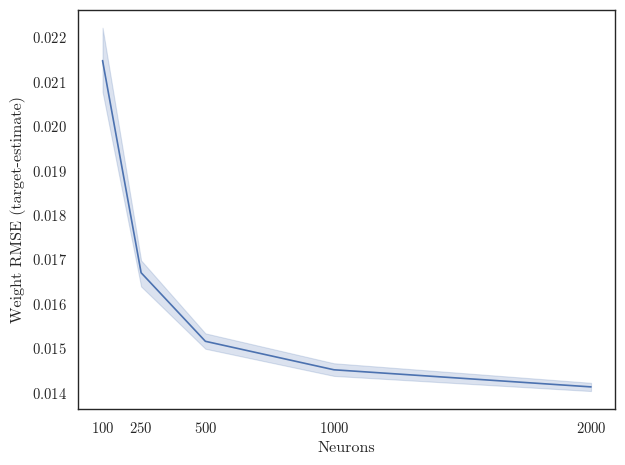

In [36]:
fig, ax = plt.subplots()
sns.lineplot(noise_data, x='neurons', y='rmse', ax=ax)
ax.set(xlabel='Neurons', ylabel='Weight RMSE (target-estimate)', xticks=n_neurons)
plt.tight_layout()
fig.savefig("plots/counting_error_vs_neurons.jpg", dpi=600)

# Jiang

In [61]:
class Environment():
    def __init__(self, dataset, sid, trial, T=1, dt=0.001, dim_context=5, seed_env=0):
        self.T = T
        self.dt = dt
        self.sid = sid
        self.trial = trial
        self.dataset = dataset
        self.empirical = pd.read_pickle(f"data/{dataset}.pkl").query("sid==@sid & trial==@trial")
        self.dim_context = dim_context
        self.rng = np.random.RandomState(seed=seed_env)
        self.context = self.rng.rand(self.dim_context)
        self.context = self.context / np.linalg.norm(self.context)
        if self.dataset=='carrabin':
            self.Tall = 5*self.T - self.dt
            self.stages = range(1, 6)
        if self.dataset=='jiang':
            self.n_neighbors = len(self.empirical['who'].unique()) - 1
            self.Tall = 3*self.T + 3*self.n_neighbors*self.T - self.dt
            self.stages = range(4)
        # create input arrays
        self.colors = []
        self.weights = []
        tt = int(self.T / self.dt / 2)
        if self.dataset=='carrabin':
            for stage in self.stages:
                color = self.empirical.query("stage==@stage")['color'].unique()[0]
                self.colors.extend(color * np.ones((tt, 1)))
                self.colors.extend(0.000 * np.ones((tt, 1)))
        if self.dataset=='jiang':
            for stage in self.stages:
                if stage==0:
                    color = self.empirical.query("stage==@stage")['color'].to_numpy()[0]
                    self.colors.extend(color * np.ones((5*tt, 1)))
                    self.colors.extend(0.000 * np.ones((1*tt, 1)))
                else:
                    for n in range(self.n_neighbors):
                        color = self.empirical.query("stage==@stage")['color'].to_numpy()[n]
                        self.colors.extend(color * np.ones((tt, 1)))
                        self.colors.extend(0.000 * np.ones((tt, 1)))
        self.colors = np.array(self.colors).flatten()
    def sample(self, t):
        tidx = int(t/self.dt)
        return [self.colors[tidx]]

## Dimensionality trick

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

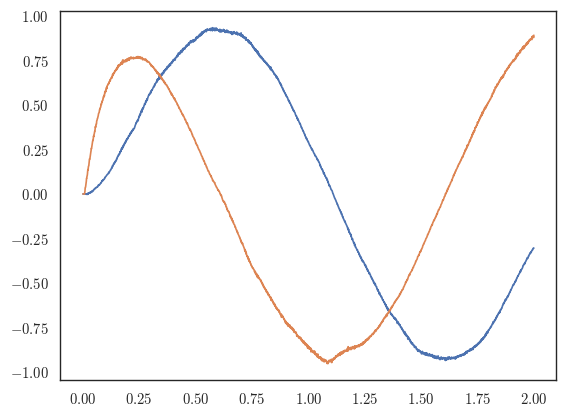

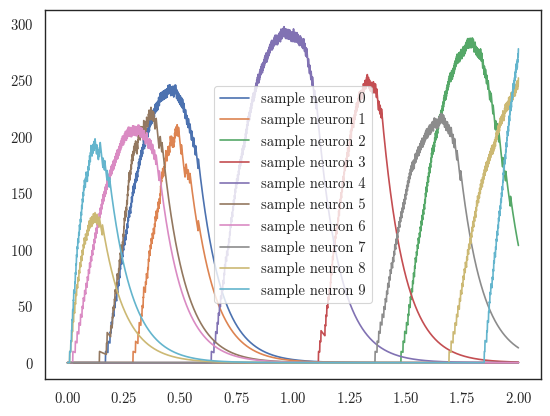

In [101]:
# encoders = nengo.dists.Choice([[1, 0], [0, 1], [-1, 0], [0, -1]])
intercepts = nengo.dists.Uniform(0.7, 1)
with nengo.Network() as net:
    node_stim = nengo.Node(lambda t: t)
    ens_stim = nengo.Ensemble(1000, 1, radius=2)
    # ens_theta = nengo.Ensemble(1000, 2)
    ens_theta = nengo.Ensemble(1000, 2, intercepts=intercepts)
    nengo.Connection(node_stim, ens_stim)
    nengo.Connection(ens_stim, ens_theta, function=lambda x: [np.sin(np.pi*x), np.cos(np.pi*x)])
    p_stim = nengo.Probe(node_stim)
    p_theta = nengo.Probe(ens_theta, synapse=0.1)
    pn_theta = nengo.Probe(ens_theta.neurons, synapse=0.1)
with nengo.Simulator(net) as sim:
    sim.run(2)
fig, ax = plt.subplots()
# ax.plot(sim.trange(), sim.data[p_stim])
ax.plot(sim.trange(), sim.data[p_theta])
# ax.plot(sim.data[p_stim], sim.data[p_theta])
plt.show()

fig, ax = plt.subplots()
for n in range(10):
    ax.plot(sim.trange(), sim.data[pn_theta][:,n], label=f'sample neuron {n}')
    ax.legend()
plt.show()

In [139]:
def pretrain_jiang(learned_weights, env, n_neurons=1000, seed_net=0, syn_fb=0.2, radius=4, a=1e-4, train=False, x_int=0.5, plot=True):
    func_stim = lambda t: env.sample(t)
    func_weight = lambda t: 1/(int(t)-1) if t>3 else 1
    func_stop = lambda t: 1 - np.abs(env.sample(t))
    func_project = lambda x: [np.sin(np.pi*x), np.cos(np.pi*x)]
    
    network = nengo.Network(seed=seed_net)
    with network:
        node_stim = nengo.Node(func_stim)
        node_target = nengo.Node(func_weight)
        node_stop = nengo.Node(func_stop)
        
        ens_stim = nengo.Ensemble(n_neurons, 1, seed=seed_net)
        ens_delta = nengo.Ensemble(n_neurons, 1, encoders=nengo.dists.Choice([[1]]), intercepts=nengo.dists.Uniform(0,1), seed=seed_net)
        ens_memory = nengo.Ensemble(n_neurons, 1, radius=radius, seed=seed_net)
        ens_project = nengo.Ensemble(n_neurons, 2, intercepts=nengo.dists.Uniform(x_int, 1), seed=seed_net)
        ens_weight = nengo.Ensemble(n_neurons, 1, seed=seed_net)
        ens_error = nengo.Ensemble(n_neurons, 1, seed=seed_net)

        conn_stim = nengo.Connection(node_stim, ens_stim, seed=seed_net)
        conn_delta1 = nengo.Connection(ens_stim, ens_delta, synapse=0.01, function=lambda x: 2*np.abs(x), seed=seed_net)
        conn_delta2 = nengo.Connection(ens_stim, ens_delta, synapse=0.1, function=lambda x: -2*np.abs(x), seed=seed_net)
        conn_memff = nengo.Connection(ens_delta, ens_memory, synapse=syn_fb, transform=syn_fb, seed=seed_net)
        conn_memfb = nengo.Connection(ens_memory, ens_memory, synapse=syn_fb, seed=seed_net)
        conn_proj = nengo.Connection(ens_memory, ens_project, synapse=0.01, function=func_project, seed=seed_net)
        if train:
            conn_weight = nengo.Connection(ens_project.neurons, ens_weight,
                                           transform=learned_weights, learning_rule_type=nengo.PES(learning_rate=a), seed=seed_net)
            conn_error1 = nengo.Connection(node_target, ens_error, transform=1, seed=seed_net)
            conn_error2 = nengo.Connection(ens_weight, ens_error, transform=-1, seed=seed_net)
            conn_learning = nengo.Connection(ens_error, conn_weight.learning_rule, transform=-1, seed=seed_net)
            conn_stop = nengo.Connection(node_stop, ens_error.neurons, transform=-1000*np.ones((n_neurons, 1)), seed=seed_net)
        else:
            conn_weight = nengo.Connection(ens_project.neurons, ens_weight, transform=learned_weights, seed=seed_net)                     

        probe_node_stim = nengo.Probe(node_stim, synapse=None)
        probe_stim = nengo.Probe(ens_stim, synapse=0.01)
        probe_target = nengo.Probe(node_target, synapse=None)
        # probe_target = nengo.Probe(node_target, synapse=syn_fb)
        probe_delta = nengo.Probe(ens_delta, synapse=0.01)
        probe_memory = nengo.Probe(ens_memory, synapse=0.01)
        probe_weight = nengo.Probe(ens_weight, synapse=0.01)
        probe_project = nengo.Probe(ens_project, synapse=0.01)
        if train:
            probe_error = nengo.Probe(ens_error, synapse=0.01)
            probe_learned_weights = nengo.Probe(conn_weight, "weights")
        network.probe_target = probe_target
        network.probe_weight = probe_weight

    sim = nengo.Simulator(network, dt=0.001, progress_bar=False)
    with sim:
        sim.run(env.Tall)

    if train:
        learned_weights = sim.data[probe_learned_weights][-1]

    if plot:
        with sns.axes_style("whitegrid"):  # This enables gridlines
            fig, axes = plt.subplots(nrows=2, sharex=True, figsize=(8,6))
            sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_stim].flatten(), label='observations', color=palette[0], ax=axes[0])
            sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_memory].flatten(), label='memory', color=palette[0], ax=axes[0])
            if train:
                sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_error].flatten(), label='error', color=palette[1], ax=axes[0])
            sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_target].flatten(), label='target', color=palette[2], ax=axes[1])
            sns.lineplot(x=sim.trange().flatten(), y=sim.data[probe_weight].flatten(), label='weight', color=palette[3], ax=axes[1])
            # axes[0].set(title=f"training iteration {seed_stim}")
            axes[1].set(xlabel='time (s)')
            plt.grid(True, axis='y')  # Enable only y-axis gridlines
            fig.tight_layout()

    if train:
        return learned_weights
    else:
        return network, sim

training iteration 1
training iteration 2
training iteration 3
training iteration 4
training iteration 5
training iteration 6
training iteration 7
training iteration 8
training iteration 9
training iteration 10
training iteration 11
training iteration 12
training iteration 13
training iteration 14
training iteration 15
training iteration 16
training iteration 17
training iteration 18
training iteration 19
training iteration 20
training iteration 21


/tmp/ipykernel_410099/2271175919.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(nrows=2, sharex=True, figsize=(8,6))


training iteration 22
training iteration 23
training iteration 24
training iteration 25
training iteration 26
training iteration 27
training iteration 28
training iteration 29
training iteration 30
training iteration 31
training iteration 32
training iteration 33
training iteration 34
training iteration 35
training iteration 36
training iteration 37
training iteration 38
training iteration 39
training iteration 40


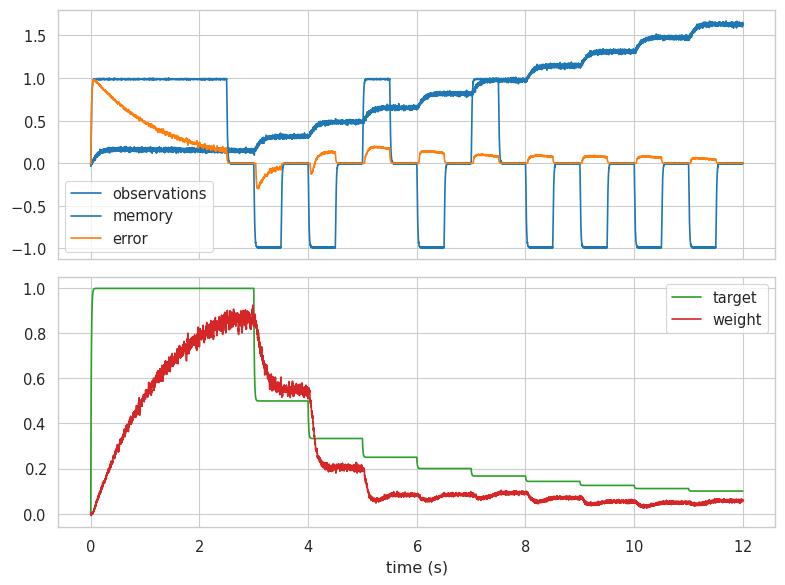

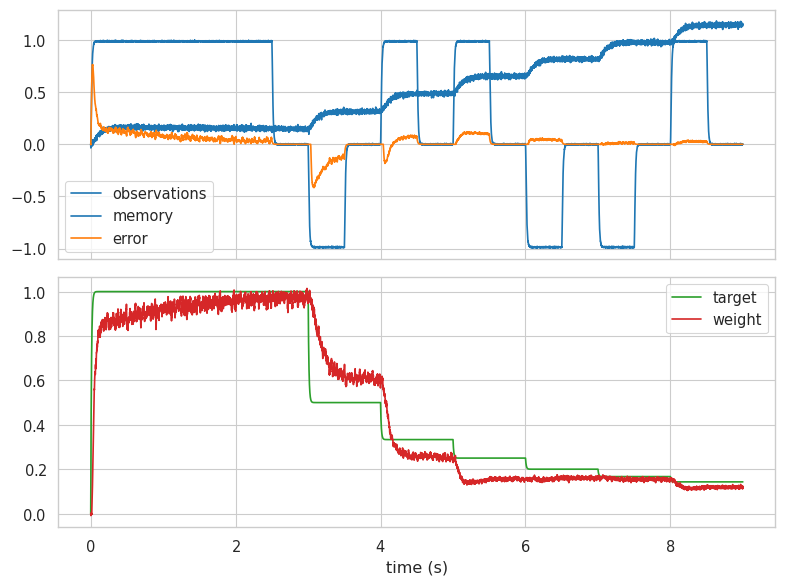

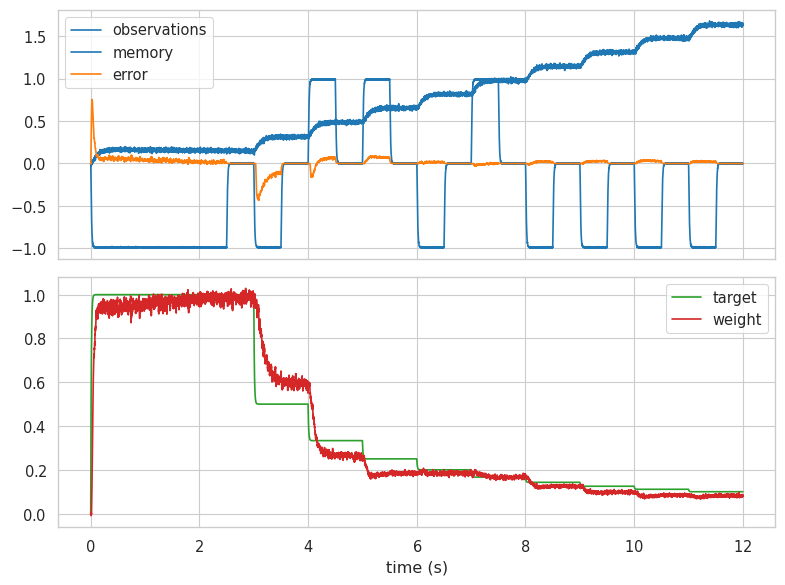

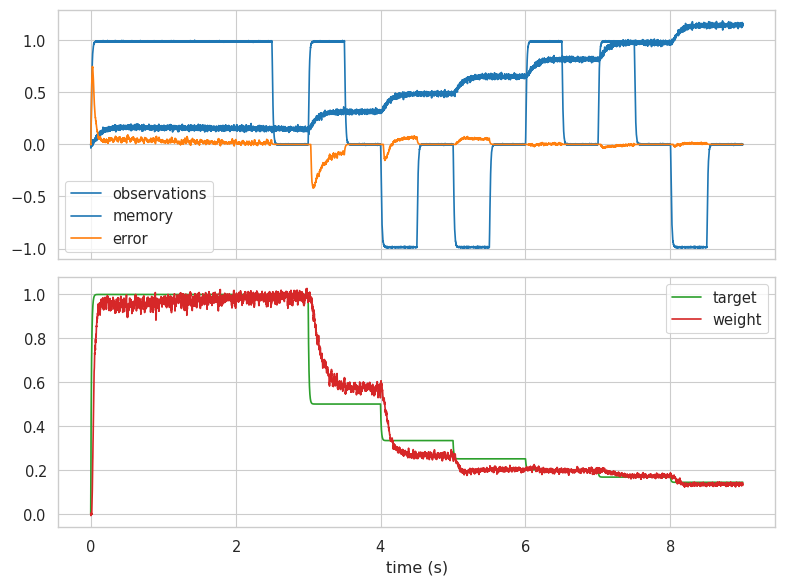

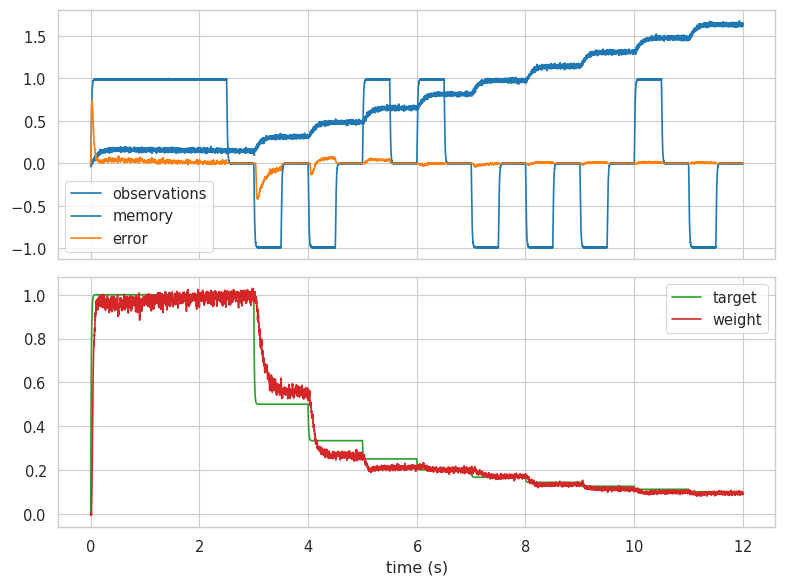

...

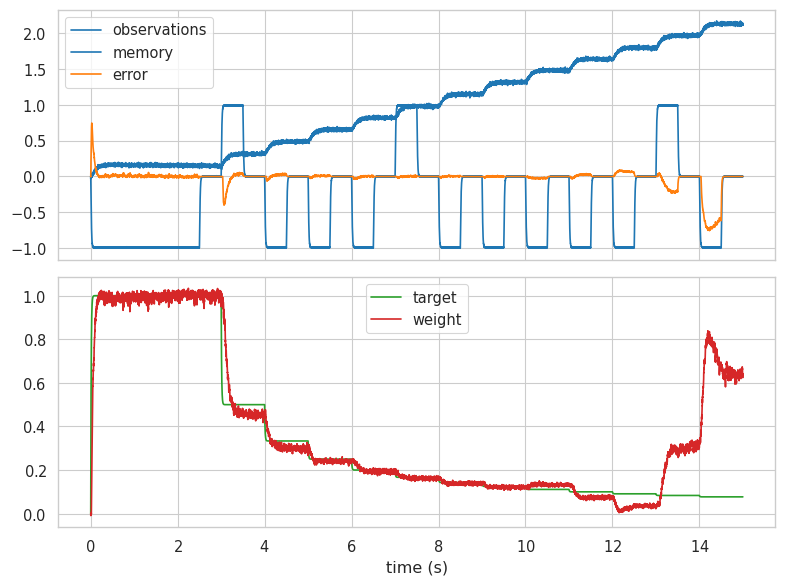

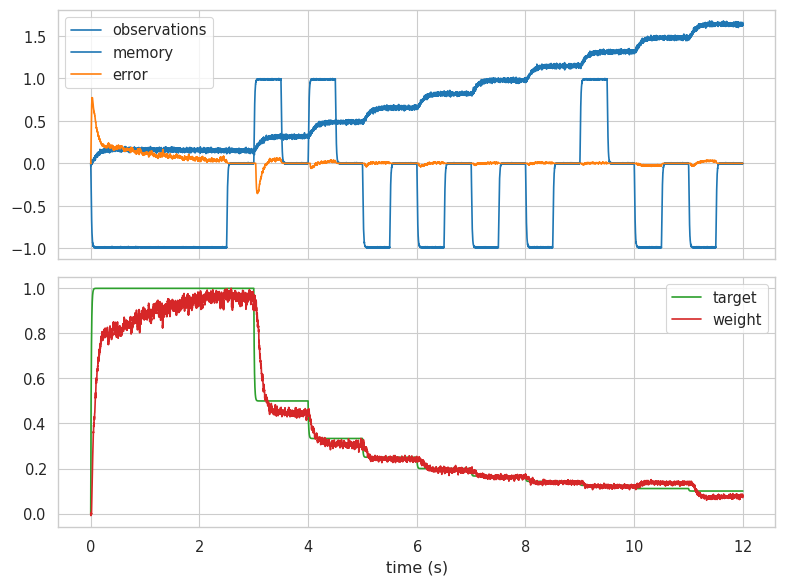

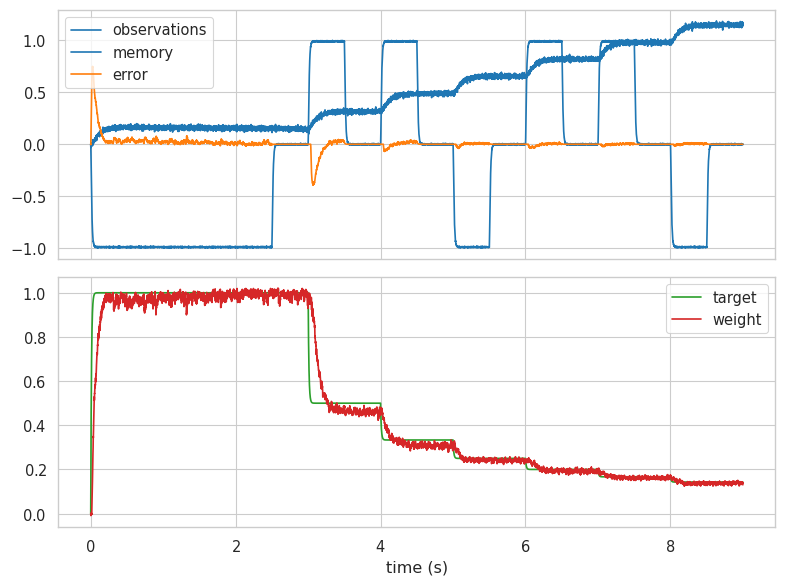

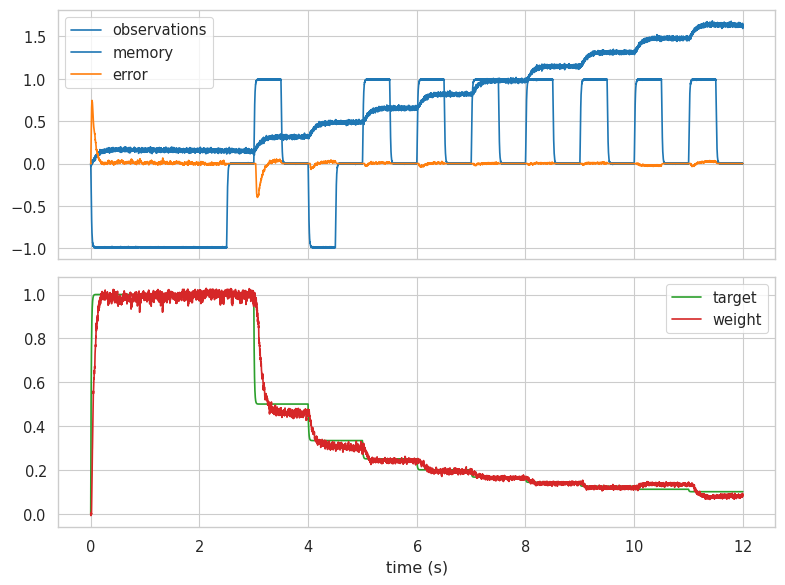

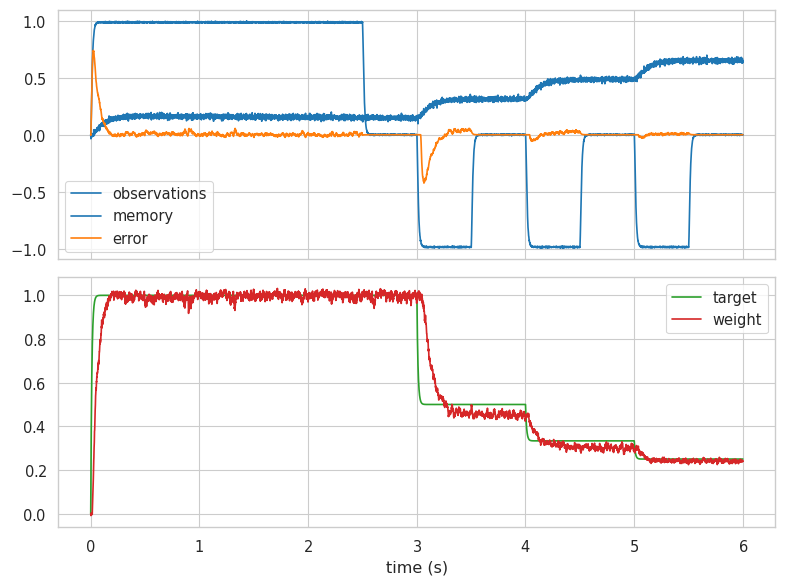

In [124]:
n_neurons = 2000
training_trials = 40
W = np.zeros((1, n_neurons))
for t in range(1, training_trials+1):
    print(f"training iteration {t}")
    env = Environment('jiang', sid=1, trial=t)
    W = pretrain_jiang(W, env, n_neurons=n_neurons, train=True)

In [145]:
n_neurons = [500, 1000, 2000]
sids = pd.read_pickle("data/jiang.pkl")['sid'].unique()
training_trials = np.arange(1, 41, 1)
testing_trials = np.arange(1, 41, 1)
seeds = np.arange(1, 11, 1)
dfs = []
columns = ['type', 'neurons', 'trial', 'time', 'target', 'error']
for n in n_neurons:
    for s in seeds:
        print(f"neurons {n}, seed {s}")
        W = np.zeros((1, n))
        for t in testing_trials:
            print(f"training iteration {t}")
            env = Environment('jiang', sid=s, trial=t)
            W = pretrain_jiang(W, env, n_neurons=n, seed_net=s, train=True, plot=False)
        for t in testing_trials:
            print(f"testing iteration {t}")
            env = Environment('jiang', sid=s, trial=t)
            net, sim = pretrain_jiang(W, env, n_neurons=n, seed_net=s, train=False, plot=False)
            times = sim.trange().flatten()
            targets = sim.data[net.probe_target].flatten()
            estimates = sim.data[net.probe_weight].flatten()
            errors = np.abs(targets - estimates)
            df = pd.DataFrame(columns=columns)
            df['type'] = ['test_type' for t in times]
            df['neurons'] = n
            df['trial'] = t
            df['time'] = times
            df['target'] = targets
            df['error'] = errors
            dfs.append(df)
noise_data = pd.concat(dfs, ignore_index=True)

neurons 500, seed 1
training iteration 1
training iteration 2
training iteration 3
training iteration 4
training iteration 5
training iteration 6
training iteration 7
training iteration 8
training iteration 9
training iteration 10
training iteration 11
training iteration 12
training iteration 13
training iteration 14
training iteration 15
training iteration 16
training iteration 17
training iteration 18
training iteration 19
training iteration 20
training iteration 21
training iteration 22
training iteration 23
training iteration 24
training iteration 25
training iteration 26
training iteration 27
training iteration 28
training iteration 29
training iteration 30
training iteration 31
training iteration 32
training iteration 33
training iteration 34
training iteration 35
training iteration 36
training iteration 37
training iteration 38
training iteration 39
training iteration 40
testing iteration 1
testing iteration 2
testing iteration 3
testing iteration 4
testing iteration 5
testing i

KeyboardInterrupt: 

### or load

In [2]:
noise_data_carrabin = pd.read_pickle("data/carrabin_mar13_counting.pkl")
noise_data_jiang = pd.read_pickle("data/jiang_mar13_counting.pkl")
noise_data_carrabin['dataset'] = "Nonsocial"
noise_data_jiang['dataset'] = "Social"
noise_data_combined = pd.concat([noise_data_carrabin, noise_data_jiang], ignore_index=True)

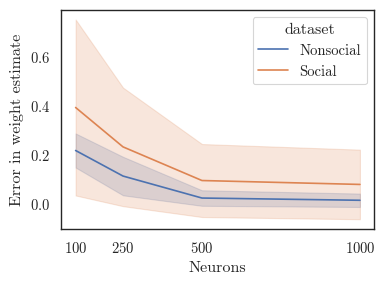

In [167]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(4, 3), sharey='row')
sns.lineplot(noise_data_combined, x='neurons', y='error', hue='dataset', ax=axes, errorbar='sd')
axes.set(ylabel='Error in weight estimate', xlabel='Neurons', xticks=noise_data_combined['neurons'].unique())
plt.tight_layout()
fig.savefig("plots/counting_error_neurons.jpg", dpi=600)

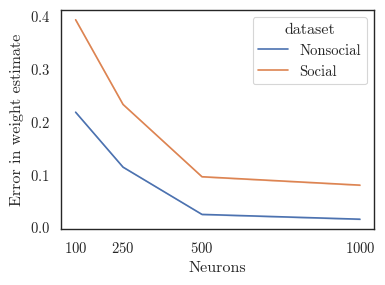

In [5]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(4, 3), sharey='row')
sns.lineplot(noise_data_combined, x='neurons', y='error', hue='dataset', ax=axes, errorbar=('ci', 99))
axes.set(ylabel='Error in weight estimate', xlabel='Neurons', xticks=noise_data_combined['neurons'].unique())
plt.tight_layout()
fig.savefig("plots/counting_error_neurons_ci.jpg", dpi=600)

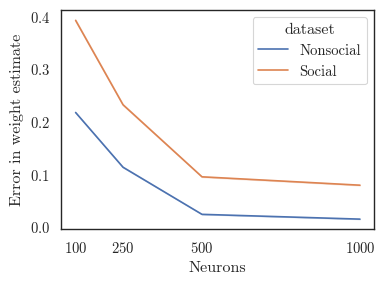

In [6]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(4, 3), sharey='row')
sns.lineplot(noise_data_combined, x='neurons', y='error', hue='dataset', ax=axes, errorbar=('se', 10))
axes.set(ylabel='Error in weight estimate', xlabel='Neurons', xticks=noise_data_combined['neurons'].unique())
plt.tight_layout()
fig.savefig("plots/counting_error_neurons_se.jpg", dpi=600)

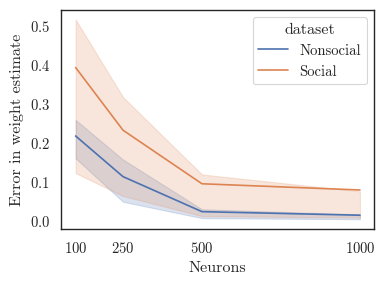

In [8]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(4, 3), sharey='row')
sns.lineplot(noise_data_combined, x='neurons', y='error', hue='dataset', ax=axes, errorbar=('pi', 50))
axes.set(ylabel='Error in weight estimate', xlabel='Neurons', xticks=noise_data_combined['neurons'].unique())
plt.tight_layout()
fig.savefig("plots/counting_error_neurons_pi.jpg", dpi=600)

In [9]:
noise_data_combined

,type,neurons,trial,time,target,error,dataset
0,test_type,100,1,0.001,0.333333,0.333333,Nonsocial
1,test_type,100,1,0.002,0.333333,0.301327,Nonsocial
2,test_type,100,1,0.003,0.333333,0.315756,Nonsocial
3,test_type,100,1,0.004,0.333333,0.332242,Nonsocial
4,test_type,100,1,0.005,0.333333,0.315815,Nonsocial
...,...,...,...,...,...,...,...
27311875,test_type,1000,40,8.995,0.142857,0.013130,Social
27311876,test_type,1000,40,8.996,0.142857,0.010806,Social
27311877,test_type,1000,40,8.997,0.142857,0.019010,Social
27311878,test_type,1000,40,8.998,0.142857,0.014105,Social


In [17]:
dfs = []
columns = ['type', 'neurons', 'trial', 'error', 'dataset']
for neuron in noise_data_combined['neurons'].unique():
    for trial in noise_data_combined['trial'].unique():
        for dataset in noise_data_combined['dataset'].unique():
            print(neuron, trial, dataset)
            subdata = noise_data_combined.query("neurons==@neuron & trial==@trial & dataset==@dataset")
            mean_error = subdata['error'].mean()
            dfs.append(pd.DataFrame([['test_type', neuron, trial, mean_error, dataset]], columns=columns))
noise_data_condensed = pd.concat(dfs, ignore_index=True)

100 1 Nonsocial
100 1 Social
100 2 Nonsocial
100 2 Social
100 3 Nonsocial
100 3 Social
100 4 Nonsocial
100 4 Social
100 5 Nonsocial
100 5 Social
100 6 Nonsocial
100 6 Social
100 7 Nonsocial
100 7 Social
100 8 Nonsocial
100 8 Social
100 9 Nonsocial
100 9 Social
100 10 Nonsocial
100 10 Social
100 11 Nonsocial
100 11 Social
100 12 Nonsocial
100 12 Social
100 13 Nonsocial
100 13 Social
100 14 Nonsocial
100 14 Social
100 15 Nonsocial
100 15 Social
100 16 Nonsocial
100 16 Social
100 17 Nonsocial
100 17 Social
100 18 Nonsocial
100 18 Social
100 19 Nonsocial
100 19 Social
100 20 Nonsocial
100 20 Social
100 21 Nonsocial
100 21 Social
100 22 Nonsocial
100 22 Social
100 23 Nonsocial
100 23 Social
100 24 Nonsocial
100 24 Social
100 25 Nonsocial
100 25 Social
100 26 Nonsocial
100 26 Social
100 27 Nonsocial
100 27 Social
100 28 Nonsocial
100 28 Social
100 29 Nonsocial
100 29 Social
100 30 Nonsocial
100 30 Social
100 31 Nonsocial
100 31 Social
100 32 Nonsocial
100 32 Social
100 33 Nonsocial
100 33 So

In [20]:
noise_data_condensed

,type,neurons,trial,error,dataset
0,test_type,100,1,0.217394,Nonsocial
1,test_type,100,1,0.414741,Social
2,test_type,100,2,0.217393,Nonsocial
3,test_type,100,2,0.397700,Social
4,test_type,100,3,0.217393,Nonsocial
...,...,...,...,...,...
315,test_type,1000,38,0.076021,Social
316,test_type,1000,39,0.014748,Nonsocial
317,test_type,1000,39,0.077203,Social
318,test_type,1000,40,0.014756,Nonsocial


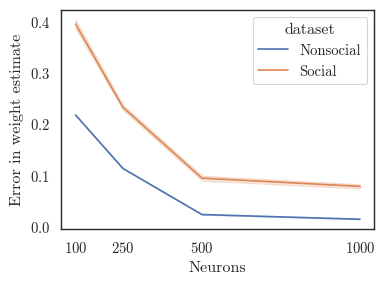

In [22]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(4, 3), sharey='row')
sns.lineplot(noise_data_condensed, x='neurons', y='error', hue='dataset', ax=axes, errorbar=('ci', 99))
axes.set(ylabel='Error in weight estimate', xlabel='Neurons', xticks=noise_data_combined['neurons'].unique())
plt.tight_layout()
fig.savefig("plots/counting_error_neurons_ci.jpg", dpi=600)